<a href="https://colab.research.google.com/github/danielzt12/AD_LTEM/blob/main/v3_sim_mag_grad_shapes_ZT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Set TV regularization weight to 1e-9 based on tests on no noise images
Toggle between noisy and noiseless images as required
Optimize over learning rates.
This version is for the shapes data

In [ ]:
%tensorflow_version 2.x
!pip install tifffile
#!pip install bm3d
#!pip install --force https://github.com/chengs/tqdm/archive/colab.zip #package to get tqdm working

In [ ]:
import tensorflow as tf
from tensorflow import signal as tfs
import tifffile as tif
import os
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import sys, time
from scipy.fftpack import *
from skimage.restoration import unwrap_phase
from tqdm import tqdm_notebook as tqdm
from scipy import ndimage
from google.colab import output
from PIL import Image

In [ ]:
import torch
torch.cuda.get_device_name(0)

'Tesla T4'

Helper function to plot 3 plots with colorbar and right size

In [ ]:
def plot3(data,titles,vmin=None,vmax=None):
  if(len(titles)<3):
    titles=["Plot1", "Plot2", "Plot3"]
  fig,ax = plt.subplots(1,3, figsize=(19,5))
  im=ax[0].imshow(data[0], norm=colors.Normalize() if vmin==None else colors.Normalize(vmin,vmax), interpolation='none')
  plt.colorbar(im, ax=ax[0])
  ax[0].set_title(titles[0])
  im=ax[1].imshow(data[1], norm=colors.Normalize() if vmin==None else colors.Normalize(vmin,vmax), interpolation='none')
  plt.colorbar(im, ax=ax[1])
  ax[1].set_title(titles[1])
  im=ax[2].imshow(data[2], norm=colors.Normalize() if vmin==None else colors.Normalize(vmin,vmax), interpolation='none')
  plt.colorbar(im, ax=ax[2])
  ax[2].set_title(titles[2])

In [ ]:
import matplotlib
plt.style.use('seaborn-white')
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20)
matplotlib.rc('font',family='Times New Roman')
matplotlib.rcParams['font.size'] = 16
plt.viridis()

<Figure size 432x288 with 0 Axes>

In [ ]:
xx,yy = np.meshgrid(np.arange(256.),np.arange(256.))
xx=xx-xx.mean()
yy=yy-yy.mean()
xxx = np.copy(xx)
yyy = np.copy(yy)
xxx[xx**2+yy**2>120**2]=0; 
yyy[xx**2+yy**2>120**2]=0

rgb_map=Plot_ColorMap(Bx=xxx, By=yyy, hsvwheel=True)
f, ax = plt.subplots(figsize=(8,8))
ax.imshow(rgb_map)
#ax.imshow(np.cos(tt*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1)
ax.set_axis_off()
plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"colorwheel.png", dpi=None, facecolor='w', edgecolor='w',\
        orientation='portrait', papertype=None, format=None,\
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)


NameError: ignored

In [ ]:
#os.environ["CUDA_VISIBLE_DEVICES"]="1"
print (tf.__version__)
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

2.3.0
Found GPU at: /device:GPU:0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


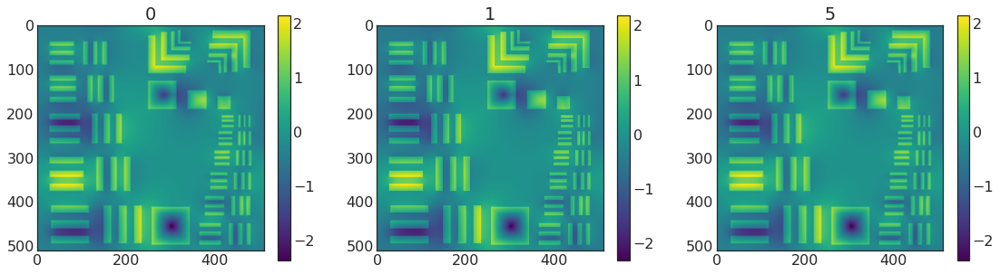

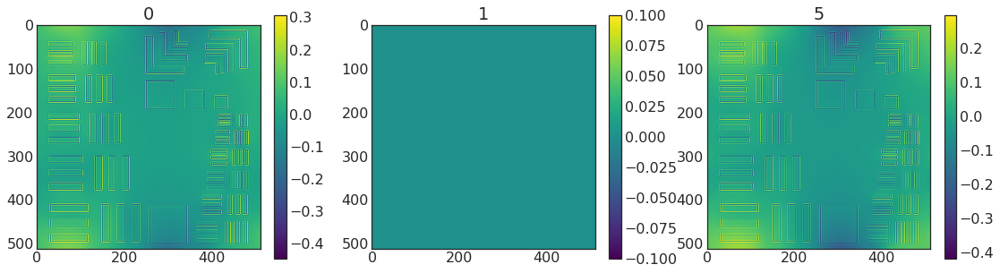

In [ ]:
t1 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/def_series/'+'Stack_nobg_nonoise_def20000_tphi.tiff.tif')[::-1]
t2 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/def_series/'+'Stack_nobg_nonoise_def40000_tphi.tiff.tif')[::-1]
t3 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/def_series/'+'Stack_nobg_nonoise_def80000_tphi.tiff.tif')[::-1]
t4 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/def_series/'+'Stack_nobg_nonoise_def120000_tphi.tiff.tif')[::-1]
t5 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/def_series/'+'Stack_nobg_nonoise_def160000_tphi.tiff.tif')[::-1]
t0 = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')
plot3([t0,t1,t5],["0", "1", "5"])
plot3([t0-t1,t0-t5,t0-t2],["0", "1", "5"])

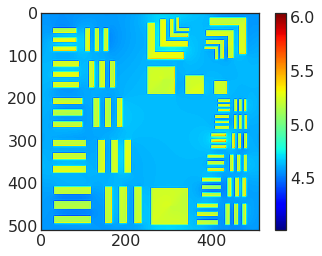

In [ ]:
plt.imshow(Ph_true-t0, cmap='jet')
plt.colorbar()

2.7111464 -2.0389721


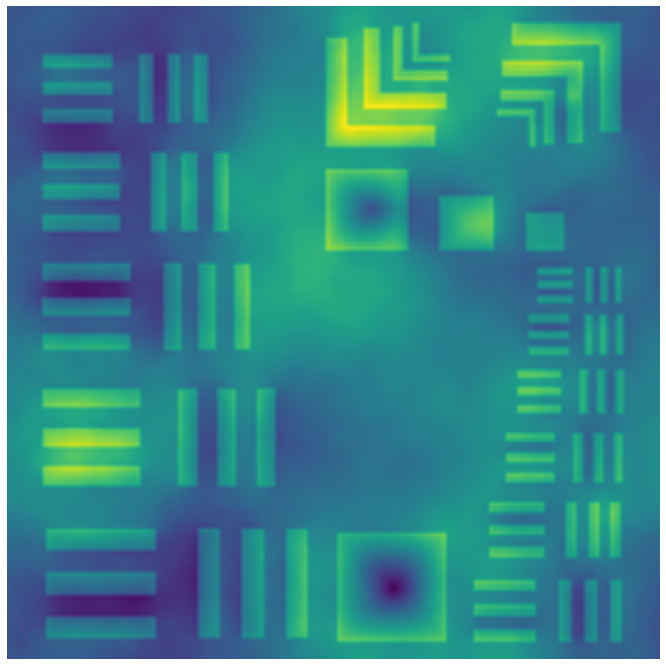

In [ ]:
f, ax = plt.subplots(figsize=(12,12))
#phase = result[0][1]
#tt = unwrap_phase(phase)
tt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise5_olddef_tphi-1.tif')[::-1]
#tt = np.load('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/AD_recons/'+'noise30_tv1e9_guess0p5_iter20000_phase_16_new.npy')
#tt = np.load('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/AD_recons/'+'noise10_guessTIE_iter20000.npy')
ax.imshow(tt-tt.mean(), vmin=-2.12, vmax=2.67)#, interpolation='none')
print((tt-tt.mean()).max(), (tt-tt.mean()).min())
#ax.imshow(Ph_true-Ph_true.mean(), vmin=-2.12, vmax=2.67)
ax.set_axis_off()
plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"TIE_5_close.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

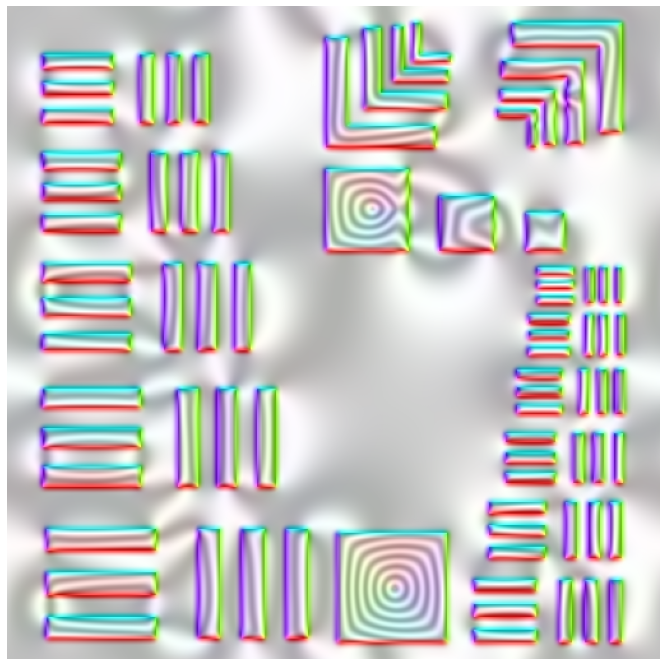

In [ ]:
tt = np.copy(Ph_true)
#tt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_noise30_s512_tphi.tiff.tif')[::-1]
#tt = np.load('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/AD_recons/'+'noise30_tv1e9_guess0p5_iter20000_phase_16.npy')
#tt = np.load('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/AD_recons/'+'noise30_guessTIE_iter20000.npy')

tphi2=ndimage.gaussian_filter(tt-np.mean(tt),2,order=0)
gx=np.gradient(tphi2,axis=0)
gy=np.gradient(tphi2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
f, ax = plt.subplots(figsize=(12,12))
ax.imshow(rgb_map)
ax.imshow(np.cos(tt*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1)
ax.set_axis_off()
plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"grad_truth_2.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
#import necessary modules
import numpy as np
from skimage import io as skimage_io
from skimage import color as skimage_color
from matplotlib import colors as mt_cols

def Plot_ColorMap(Bx = np.random.rand(256,256), By = np.random.rand(256,256), \
                  hsvwheel = False, filename = 'Vector_ColorMap.jpeg'):
    # first get the size of the input data
    [dimx,dimy] = Bx.shape
    #inset colorwheel size - 100 px
    csize = 100
    #co-ordinate arrays for colorwheel.
    line = np.arange(csize) - float(csize/2)
    [X,Y] = np.meshgrid(line,line,indexing = 'xy')
    th = np.arctan2(Y,X)
    h_col = (th + np.pi)/2/np.pi
    rr = np.sqrt(X**2 + Y**2)
    msk = np.zeros(rr.shape)
    msk[np.where(rr <= csize/2)] = 1.0
    rr *= msk
    rr /= np.amax(rr)
    val_col = np.ones(rr.shape) * msk
    

    #Compute the maximum in magnitude BB = sqrt(Bx^2 + By^2)
    mmax = np.amax(np.sqrt(Bx**2 + By**2))
    # Normalize with respect to max.
    Bx /= float(mmax)
    By /= float(mmax)
    #Compute the magnitude and scale between 0 and 1
    Bmag = np.sqrt(Bx**2 + By**2)
    
    if hsvwheel:
        # Here we will proceed with using the standard HSV colorwheel routine.
        # Get the Hue (angle) as By/Bx and scale between [0,1]
        hue = (np.arctan2(By,Bx) + np.pi)/2/np.pi
        # Array to hold the colorimage.
        color_im = np.zeros([dimx, dimy, 3])
        #First the Hue.
        color_im[0:dimx,0:dimy,0] = hue
        # Then the Sat.
        color_im[0:dimx,0:dimy,1] = Bmag
        # Then the Val.
        color_im[0:dimx,0:dimy,2] = np.ones([dimx,dimy])
        # Convert to RGB image.
        rgb_image = mt_cols.hsv_to_rgb(color_im)
    else:
        #Here we proceed with custom RGB colorwheel.
        #Arrays for each RGB channel
        red = np.zeros([dimx,dimy])
        gr = np.zeros([dimx,dimy])
        blue = np.zeros([dimx,dimy])
    
        #Scale the magnitude between 0 and 255
        cmag = Bmag #* 255.0
        #Compute the cosine of the angle
        cang =  Bx / cmag
        #Compute the sine of the angle
        sang = np.sqrt(1.0 - cang**2)
        #first the green component
        qq = np.where((Bx < 0.0) & (By >= 0.0))
        gr[qq] = cmag[qq] * np.abs(cang[qq])
        qq = np.where((Bx >= 0.0) & (By < 0.0))
        gr[qq] = cmag[qq] * np.abs(sang[qq])
        qq = np.where((Bx < 0.0) & (By < 0.0))
        gr[qq] = cmag[qq]
        # then the red
        qq = np.where((Bx >= 0.0) & (By < 0.0))
        red[qq] = cmag[qq]
        qq = np.where((Bx >=0.0) & (By >= 0.0))
        red[qq] = cmag[qq] * np.abs(cang[qq])
        qq = np.where((Bx < 0.0) & (By < 0.0))
        red[qq] = cmag[qq] * np.abs(sang[qq])
        # then the blue
        qq = np.where(By >= 0.0)
        blue[qq] = cmag[qq] * np.abs(sang[qq])
        # Store the color components in the RGB image
        rgb_image = np.zeros([dimx+csize,dimy,3])
        rgb_image[0:dimx,0:dimy,0] = red
        rgb_image[0:dimx,0:dimy,1] = gr
        rgb_image[0:dimx,0:dimy,2] = blue
    
        #Recompute cmag, cang, sang for the colorwheel representation.
        mmax = np.amax([np.abs(X),np.abs(Y)])
        X /= mmax
        Y /= mmax
        cmag = np.sqrt(X**2 + Y**2) #* 255.0
        cang =  X / cmag
        sang = np.sqrt(1.0 - cang**2)
        # Arrays for colorwheel sizes
        red = np.zeros([csize,csize])
        gr = np.zeros([csize,csize])
        blue = np.zeros([csize,csize])
        #first the green component
        qq = np.where((X < 0.0) & (Y >= 0.0))
        gr[qq] = cmag[qq] * np.abs(cang[qq])
        qq = np.where((X >= 0.0) & (Y < 0.0))
        gr[qq] = cmag[qq] * np.abs(sang[qq])
        qq = np.where((X < 0.0) & (Y < 0.0))
        gr[qq] = cmag[qq]
        # then the red
        qq = np.where((X >= 0.0) & (Y < 0.0))
        red[qq] = cmag[qq]
        qq = np.where((X >=0.0) & (Y >= 0.0))
        red[qq] = cmag[qq] * np.abs(cang[qq])
        qq = np.where((X < 0.0) & (Y < 0.0))
        red[qq] = cmag[qq] * np.abs(sang[qq])
        # then the blue
        qq = np.where(Y >= 0.0)
        blue[qq] = cmag[qq] * np.abs(sang[qq])

        #Store in the colorimage
        rgb_image[dimx:,dimy/2-csize/2:dimy/2+csize/2,0] = red * msk
        rgb_image[dimx:,dimy/2-csize/2:dimy/2+csize/2,1] = gr * msk
        rgb_image[dimx:,dimy/2-csize/2:dimy/2+csize/2,2] = blue * msk

    # Now we have the RGB image. Save it and then return it.
    # skimage_io.imsave(filename,rgb_image)

    return rgb_image



In [ ]:
A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

defocus = np.linspace(-.16e6,.16e6,17)

B_samples = np.zeros((defocus.shape[0], A_sample.shape[0], A_sample.shape[1]))
tf_microscope = np.zeros(B_samples.shape, dtype=np.complex64)
for i in range(defocus.shape[0]):
  TEM.defocus = defocus[i]
  tf_microscope[i] = TEM.getTransferFunction(qq, del_px)
  B_samples[i] = np.abs(ifft2(tf_microscope[i]*fftshift(fft2(A_sample*np.exp(1j*Ph_true)))))**2


B_samples = np.sqrt(B_samples)
B_samples/=B_samples.mean()

In [ ]:
print('path')

path


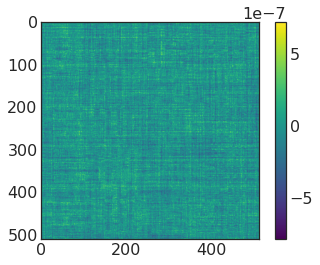

In [ ]:
plt.imshow(A_samples[0]-B_samples[0])
plt.colorbar()

In [ ]:
#!ls /content/drive/My\ Drive/AD_Lorentz/forward_model/test_data
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

A_samples = np.zeros((17,512,512))
defocus = np.linspace(-.16e6,.16e6,17)

for i in range(17):
  A_samples[i] =  tif.imread(path+"noise10/Img_nobckgrd_def_{0:d}.0.tiff".format(int(defocus[i])))

print((A_samples<0).sum())
A_samples[A_samples<0]=0
A_samples = np.sqrt(A_samples)
A_samples/=A_samples.mean()

0


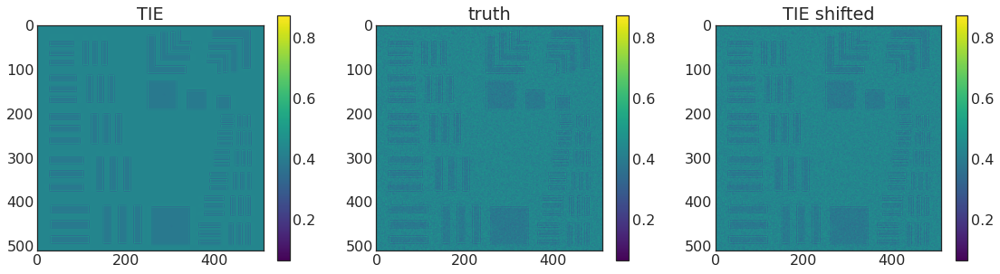

In [ ]:
A1_samples = np.zeros((17,512,512))
for i in range(17):
  A1_samples[i] =  tif.imread(path+"no_noise/Img_nobckgrd_def_{0:d}.0.tiff".format(int(defocus[i])))
A2_samples = np.zeros((17,512,512))
for i in range(17):
  A2_samples[i] =  tif.imread(path+"noise10/Img_nobckgrd_def_{0:d}.0.tiff".format(int(defocus[i])))
plot3([A1_samples[7],A2_samples[7],A2_samples[7]],["TIE", "truth", "TIE shifted"])

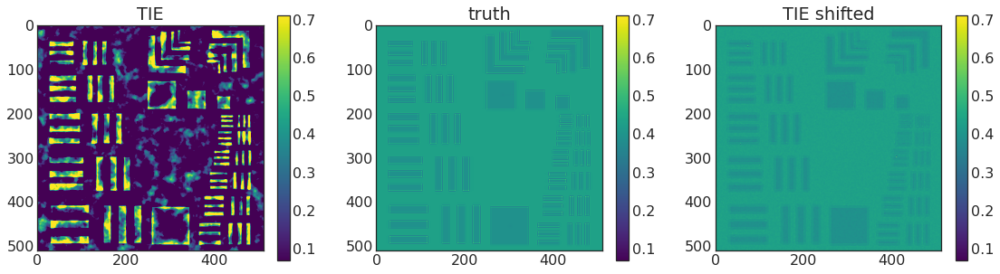

In [ ]:
#ttt = tif.imread(path+'TIE_recons/Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
ttt = tif.imread(path+'TIE_recons/tikh_filtered_results/Stacknobg_noise30_s512_tphi_tikh40.tiff.tif')[::-1]
#tt1=np.abs(ifft2((tf_microscope[7]*(fft2(A_sample*np.exp(1j*Ph_true))))))**2
#tt2=np.abs(ifft2((tf_microscope[7]*(fft2(A_sample*np.exp(1j*ttt))))))**2
tt1=np.abs(ifft2(fftshift(tf_microscope[7]*fftshift(fft2(A_sample*np.exp(1j*Ph_true))))))**2
tt2=np.abs(ifft2(fftshift(tf_microscope[7]*fftshift(fft2(A_sample*np.exp(1j*ttt))))))**2
plot3([ttt,tt1,tt2],["TIE", "truth", "TIE shifted"])

In [ ]:
##########do not run this

defocus = np.linspace(-1.6e6,1.6e6,65)
#defocus = np.linspace(0,.16e6,65)
print(defocus)

A_samples = np.zeros((defocus.shape[0], A_sample.shape[0], A_sample.shape[1]))
A_noise = np.zeros((defocus.shape[0], A_sample.shape[0], A_sample.shape[1]))

tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)
for i in range(defocus.shape[0]):
  TEM.defocus = defocus[i]
  tf_microscope[i] = TEM.getTransferFunction(qq, del_px)
  A_samples[i] = np.abs((ifft2(tf_microscope[i]*fftshift(fft2(A_sample*np.exp(1j*Ph_true))))))

A_samples /= A_samples.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#np.save(path+"A_samples.npy", A_samples) # amplitude

A_noise_percent = np.random.normal(A_samples**2, 0.01*A_samples**2)-A_samples**2 # intensity
np.save(path+"A_noise.npy", A_noise_percent) # intensity

np.save(path+"A_samples0.npy", A_samples) # amplitude

np.save(path+"tf_microscope.npy", tf_microscope)

h,w = A_sample.shape[0], A_sample.shape[1]
zoom1, zoom2 = 150,350

[-1600000. -1550000. -1500000. -1450000. -1400000. -1350000. -1300000.
 -1250000. -1200000. -1150000. -1100000. -1050000. -1000000.  -950000.
  -900000.  -850000.  -800000.  -750000.  -700000.  -650000.  -600000.
  -550000.  -500000.  -450000.  -400000.  -350000.  -300000.  -250000.
  -200000.  -150000.  -100000.   -50000.        0.    50000.   100000.
   150000.   200000.   250000.   300000.   350000.   400000.   450000.
   500000.   550000.   600000.   650000.   700000.   750000.   800000.
   850000.   900000.   950000.  1000000.  1050000.  1100000.  1150000.
  1200000.  1250000.  1300000.  1350000.  1400000.  1450000.  1500000.
  1550000.  1600000.]


In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
#path = '/content/drive/My Drive/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

tf_microscope = np.load(path+"tf_microscope.npy")[::8]
A_samples = np.load(path+"A_samples_noise_10.npy")[::8]
print(A_samples.shape)

(9, 512, 512)


In [ ]:
truth = A_sample*np.exp(1j*Ph_true)
Ph_true_mean = Ph_true-Ph_true.mean()

### Read in image data
Normalize and take square root

In [ ]:
sys.path.append('/content/drive/My Drive/')

from microscopes_fwd import Microscope

#inititiate microscope class
TEM = Microscope(Cs = 1.0e6, theta_c = 0.01e-3, def_spr = 500)

#reciprocal space vectors
[dim,dim] = A_sample.shape
d2=dim/2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 5 #nm/px

#set the desired defocus of the microscope
#TEM.defocus = 500000.0 #nm

#get transfer function
#tf_microscope = TEM.getTransferFunction(qq, del_px)

#save TF as numpy array
#np.save('TF_microscope_def%d' %TEM.defocus, tf_microscope)

In [ ]:
tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)
for i in range(defocus.shape[0]):
  TEM.defocus = defocus[i]
  tf_microscope[i] = TEM.getTransferFunction(qq, del_px)

h,w = A_sample.shape[0], A_sample.shape[1]
zoom1, zoom2 = 150,350


NameError: ignored

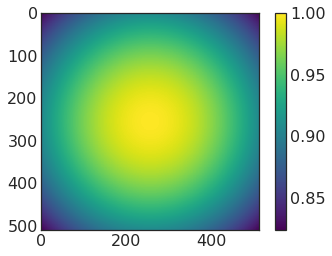

In [ ]:
TEM.defocus = 100000
tf_microscope = TEM.getTransferFunction(qq, del_px)
plt.imshow(np.abs((tf_microscope)))
plt.colorbar()

### Generate microscope transfer function

(33, 512, 512)
A_samples_noise10_defoc32.npy


### Optimization and loss functions

In [ ]:
def compute_loss():
  tf_obj_real = intens*tf.math.cos(phase)
  tf_obj_imag = intens*tf.math.sin(phase)
  tf_obj = tf.complex(tf_obj_real, tf_obj_imag)

  guess_img = tfs.ifft2d(tfs.ifftshift(tfs.fftshift(tfs.fft2d(tf_obj))*tf_microscope, axes=(1,2)))

  guess_img = tf.abs(guess_img)
  guess_img /= tf.reduce_mean(guess_img, axis=(1,2), keepdims=True)
  #losses = tf.reduce_mean(tf.abs(guess_img - exp_img))
  losses = tf.reduce_mean((guess_img - exp_img)**2)#+ \
#            lamb2*tf.image.total_variation(tf.reshape(phase,[h,w,1]))
#           lamb1*tf.image.total_variation(tf.reshape(intens,[h,w,1]))+ 

  global gerr 
  gerr = losses
  return losses

def optiz(tol=1e-7, max_iter=100, lr=0.01):
  err = np.Inf # step error (banach), not actual erro
  i = 0
  #flag = 1
  errs = []
  accs = []
  acc0 = 0
  #print(lr)
  for i in (range(max_iter)):
    opt = tf.optimizers.Adam(learning_rate=lr)
    train = opt.minimize(compute_loss, var_list=[phase]) #Optim only over phase
    errs.append(gerr.numpy())
    ph_mean = phase.numpy()
    ph_mean -= ph_mean.mean()
    acc1 = (ph_mean*Ph_true_mean).sum() / np.sqrt((ph_mean*ph_mean).sum() * (Ph_true_mean*Ph_true_mean).sum())
    #if acc1<acc0 and flag:
    #  print(i, acc1)
    #  np.save(path+"AD_recons/tmp.npy", ph_mean)
    #  flag = 0
    accs.append(acc1)  #################
    acc0 = acc1
    i += 1

  #print ("Ran %d iterations" %i)
  return [intens.numpy(), phase.numpy()], errs, accs

In [ ]:
ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise10_tphi-1.tif')[::-1]
#ttt = phase.numpy()
ttt -= ttt.mean()
Ph_true_mean = Ph_true-Ph_true.mean()
print((ttt*Ph_true_mean).sum() / np.sqrt((ttt*ttt).sum() * (Ph_true_mean*Ph_true_mean).sum()))

0.8893491


In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
#path = '/content/drive/My Drive/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

tf_microscope = np.load(path+"tf_microscope.npy")[[26,28,30,64]]
A_samples = np.load(path+"amplitude4TIE_noise10.npy")[[26,28,30,64]]
#A_samples = np.load(path+"A_samples0.npy")[[34,36,38,64]]


#A_samples = np.load(path+"A_samples_noise20_defoc2.npy")

print(tf_microscope.shape, A_samples.shape)

truth = A_sample*np.exp(1j*Ph_true)
Ph_true_mean = Ph_true-Ph_true.mean()

(4, 512, 512) (4, 512, 512)


In [ ]:
exp_img = tf.constant(A_samples, dtype=tf.float32)
#intens = tf.constant(A_sample/A_sample.mean(), dtype='float32')
#intens = tf.constant(A_samples[0], dtype='float32')
intens = tf.constant(np.load(path+"denoise_tv_chambolle_A10.npy"), dtype='float32')
phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')
##ttt = tif.imread(path+'TIE_recons/Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
#ttt = np.load(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32.npy")
#phase = tf.Variable(Ph_true-Ph_true.mean(), dtype='float32')
#lamb1 = 1e-9 #Add TV minimization for intens
#lamb2 = 1e-7 #Add TV minimization for phase

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [.8] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)
  

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])
print(np.array(tot_accs[0]).max())
print(np.array(tot_accs[0]).argmax())
print(tot_errs[0][np.array(tot_accs[0]).argmax()])

361.65003490448
0.9927751
0.99277514
19998
0.0020090146


In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
#for i in range(len(tot_errs)):
ax.plot(np.log10(np.array(tot_errs).flatten()))
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("Log(mean squared error)")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()

No handles with labels found to put in legend.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


0.97938776


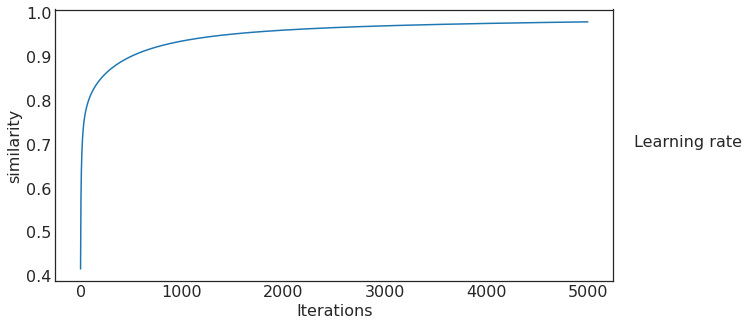

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
for i in range(len(tot_accs)):
  ax.plot(np.array(tot_accs).flatten())
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("similarity")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()
print(np.array(tot_accs).max())

In [ ]:
print(np.array(tot_accs)[0][5000])

0.9737301


2.720035212467541 -2.3679903574482304


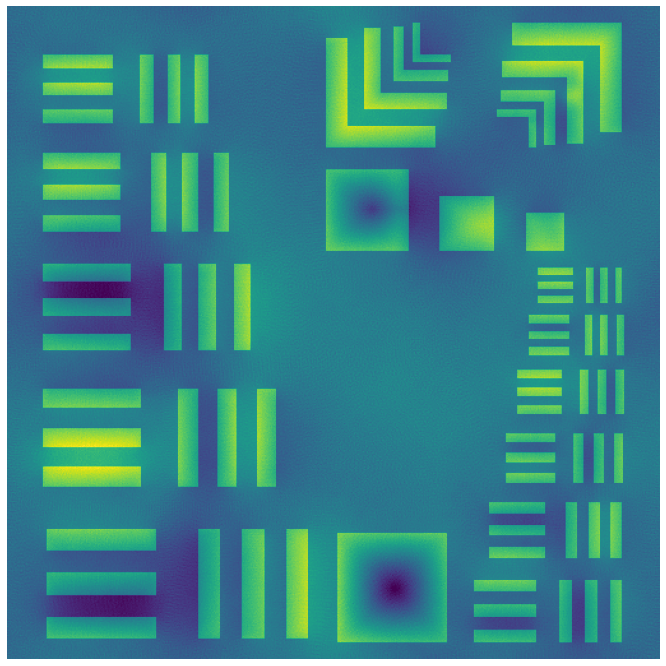

In [ ]:
f, ax = plt.subplots(figsize=(12,12))
phase2 = result[0][1]
tt = unwrap_phase(phase2)
ax.imshow(tt-tt.mean(), vmin=-2.12, vmax=2.67)#, interpolation='none')
print((tt-tt.mean()).max(), (tt-tt.mean()).min())
ax.set_axis_off()
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig8_8.png", dpi=None, facecolor='w', edgecolor='w',
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise5_064_5000iter_noisyamp.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

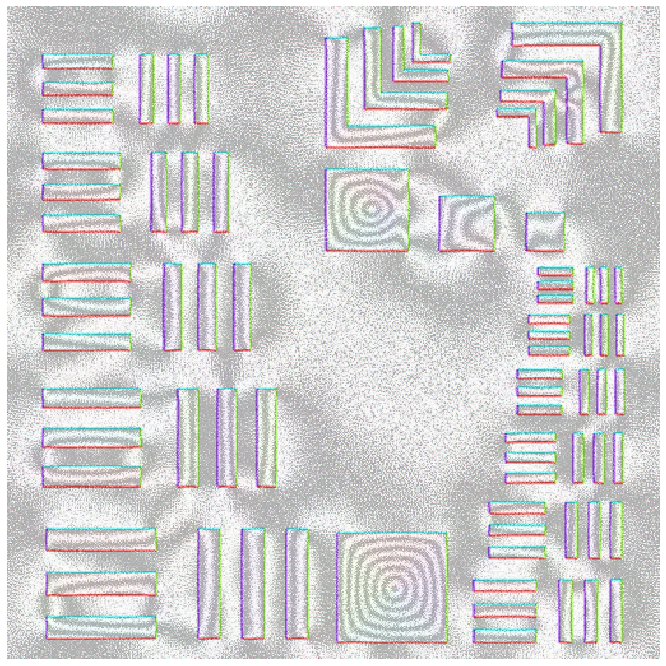

In [ ]:
tphi2=ndimage.gaussian_filter(tt-np.mean(tt),0,order=0)
gx=np.gradient(tphi2,axis=0)
gy=np.gradient(tphi2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
f, ax = plt.subplots(figsize=(12,12))
ax.imshow(rgb_map)
#ax.imshow(tt-tt.mean(), vmin=-2.12, vmax=2.67, interpolation='none', cmap='gray', alpha=0.3)
ax.imshow(np.cos(tphi2*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1, interpolation='none')
ax.set_axis_off()
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig8_8_grad.png", dpi=None, facecolor='w', edgecolor='w',
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"grad_noise5_2935_5000iter_noisyamp_f0.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
np.savetxt("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise5_064_5000iter_noisyamp.txt", np.vstack([tot_accs[0], tot_errs[0]]).T)

In [ ]:
np.save("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise5_064_5000iter_noisyamp.npy", result[0][1])

(-0.1, 1.3)


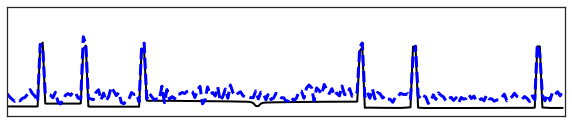

In [ ]:
def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2*0+mag_y**2)**0.5
  return mag_mag

fig, ax = plt.subplots(figsize=(10,2))
ax.plot(calc_mag(Ph_true)[457,205:425], 'k-', linewidth=2)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise20_olddef_tphi-1.tif")[::-1]
#ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),0,order=0)
#ax.plot(calc_mag(ttt)[457,205:425], 'g--', linewidth=3)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise20_tphi-1.tif")[::-1]
#ttt -= ttt.mean()
#ax.plot(calc_mag(ttt)[457,205:425], '--', color="#EF8633", linewidth=3)

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise20_34366264_20000iter_noisyamp.npy")
ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),0,order=0)
ax.plot(calc_mag(ttt)[454:460,205:425].mean(0), 'b--', linewidth=3)



ax.set_xlim(0, 220)
ax.set_ylim(-0.1, 1.3)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figs5_cut3.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

'\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_3436_5000iter_noisyamp.npy")\nttt -= ttt.mean()\nax.plot(calc_mag(ttt)[457,205:425], \'b\')\n\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise14_34363864_5000iter_noisyamp.npy")\nttt -= ttt.mean()\nplt.plot(calc_mag(ttt)[457,205:425], \'orange\')\n\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_10kiter_noisyamp.npy")\nttt -= ttt.mean()\nplt.plot(calc_mag(ttt)[457,205:425], \'r\')\n\n\n'

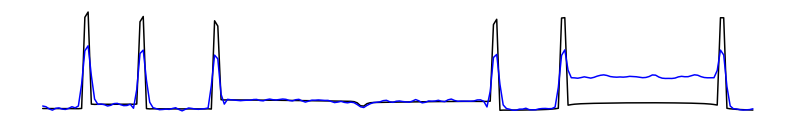

In [ ]:
f, ax = plt.subplots(figsize=(14,2))
ax.set_axis_off()
ax.plot(calc_mag(Ph_true)[457,205:425], 'k')
ax.plot(calc_mag(tphi2)[457,205:425], 'b')



"""
ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_3436_5000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot(calc_mag(ttt)[457,205:425], 'b')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise14_34363864_5000iter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'orange')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_10kiter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'r')


"""

#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"fig3_cut_close_green.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)


In [ ]:
data_in = numpy.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_2_100kiter_nonoiseamp.npy")

cen = [256, 256]
xxx = []
yyy = []
pp=3
pyplot.figure()
for r in range(400):
    data_out = []
    angle = numpy.linspace(0,2*numpy.pi,pp*r)
    for i in range(len(angle)):
        x = int(round(cen[0]+r*cos(angle[i]),0))
        y = int(round(cen[1]+r*sin(angle[i]),0))
        #print x,y
        if x>=512 or y>= 512:
            continue
        data_out += [data_in[y,x]]
        #data_in[y-5:y+5,x-5:x+5] = 0

    data_out = numpy.array(data_out)
    yy = numpy.abs(fft(data_out)[0:int(1.5*r)])
    #xx = numpy.linspace(0,1,3*r)[0:int(1.5*r)]

    #pyplot.figure()
    #pyplot.plot(data_out)
    #pyplot.figure()
    #pyplot.plot(yy)

    yymax = yy[5:].argmax()+5
    yyperiod = pp*r/yymax
    yydistance = 2*numpy.pi/pp/r*yyperiod*r*6
    #print r, yydistance
    xxx += [1/yydistance]
    #print yymax, r
    ##yyy += [data_out[numpy.argsort(data_out)][-1*int(pp*r/60)]-data_out[numpy.argsort(data_out)][int(pp*r/60)]]
    #data_out = data_out[:data_out.shape[0]/yymax*yymax]
    #data_norm = ((data_out.reshape(data_out.shape[0]/yymax, yymax).sum(1).reshape(data_out.shape[0]/yymax,1))*numpy.ones(yymax)).flatten()
    #data_out /= data_norm
    yyy += [data_out[numpy.argsort(data_out)][-5]-data_out[numpy.argsort(data_out)][5]]

xxx = numpy.array(xxx)

yyy = numpy.array(yyy)
yyy[xxx>0.03]=0
xxx[xxx>0.03]=0
yyy = yyy-yyy.min()
yyy = yyy/yyy.max()
print yyy.max(), xxx[yyy.argmax()]
pyplot.plot(xxx,yyy, '.')
    
pyplot.figure()
pyplot.imshow(data_in)





#pyplot.show()
#numpy.savetxt("test.txt", numpy.vstack((xxx,yyy)).T)


# END

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

Ran 20000 iterations
364.648556470871
0.94346154


In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

In [ ]:
print('done')

In [ ]:
np.savetxt(path+"AD_recons/noise0_tv1e9_guess0p5_iter20000_phase_4.txt", np.vstack([tot_accs[0], tot_errs[0]]).T)

In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
#path = '/content/drive/My Drive/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

tf_microscope = np.load(path+"tf_microscope.npy")[::32]
A_samples = np.load(path+"A_samples_noise_0.npy")[::32]
print(A_samples.shape)

(3, 512, 512)


In [ ]:
exp_img = tf.constant(A_samples, dtype=tf.float32)
intens = tf.constant(A_sample, dtype='float32')
#phase = tf.Variable(Ph_true + (np.random.random(A_sample.shape)-0.5)*4, dtype='float32')
#phase = tf.Variable(np.random.random(A_sample.shape)+1, dtype='float32')
phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')
##ttt = tif.imread(path+'TIE_recons/Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
#ttt = np.load(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32.npy")
#phase = tf.Variable(ttt, dtype='float32')
#lamb1 = 1e-9 #Add TV minimization for intens
lamb2 = 1e-7 #Add TV minimization for phase

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

Ran 20000 iterations
336.39054107666016
0.9425359


In [ ]:
np.savetxt(path+"AD_recons/noise10_tv1e9_guess0p5_iter100000_phase_8_direct.txt", np.vstack([tot_accs[0], tot_errs[0]]).T)

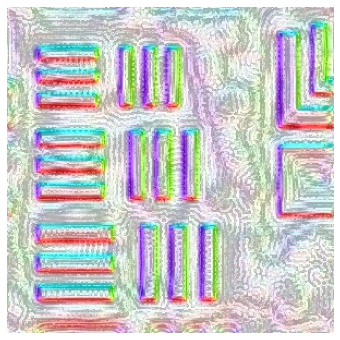

In [ ]:
tphi2=ndimage.gaussian_filter(phase.numpy()-np.mean(phase.numpy()),2,order=0)
gx=np.gradient(tphi2,axis=0)
gy=np.gradient(tphi2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
f, ax = plt.subplots(figsize=(6,6))
ax.imshow(rgb_map)
ax.imshow(np.cos(phase.numpy()*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1)
ax.set_axis_off()

In [ ]:
#tot_errs = []
#tot_accs = []
phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[-1][-1])

Ran 20000 iterations
505.40032267570496
0.95938575


In [ ]:
#tot_errs = []
#tot_accs = []
phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[-1][-1])

Ran 20000 iterations
496.4403290748596
0.96755236


In [ ]:
#tot_errs = []
#tot_accs = []
phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[-1][-1])

Ran 20000 iterations
498.2867360115051
0.97178614


In [ ]:
#tot_errs = []
#tot_accs = []
phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for lr in lrs:
  tot_iters = 20000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[-1][-1])

Ran 20000 iterations
491.2115559577942
0.97438


No handles with labels found to put in legend.


Text(0, 0.5, 'Log(mean squared error)')

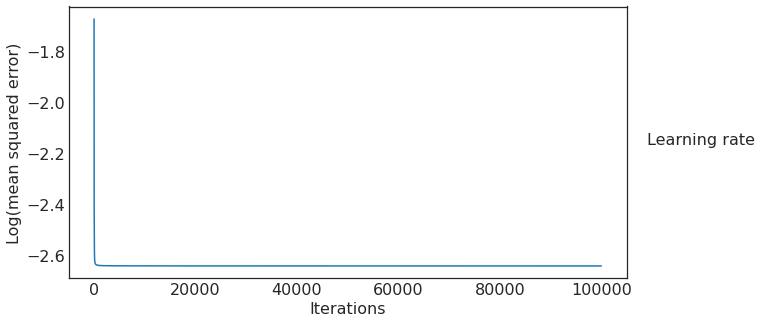

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
#for i in range(len(tot_errs)):
ax.plot(np.log10(np.array(tot_errs).flatten()))
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("Log(mean squared error)")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()

No handles with labels found to put in legend.


0.97438


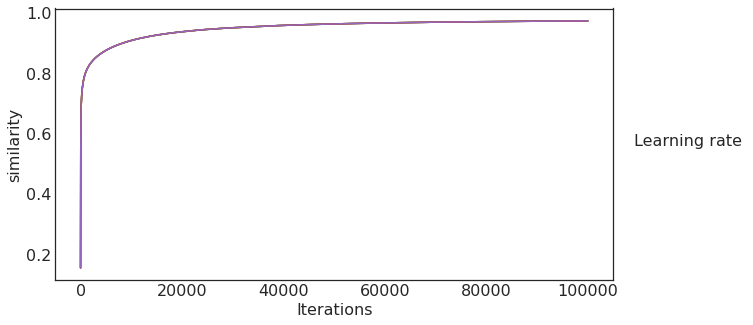

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
for i in range(len(tot_accs)):
  ax.plot(np.array(tot_accs).flatten())
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("similarity")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()
print(np.array(tot_accs).max())

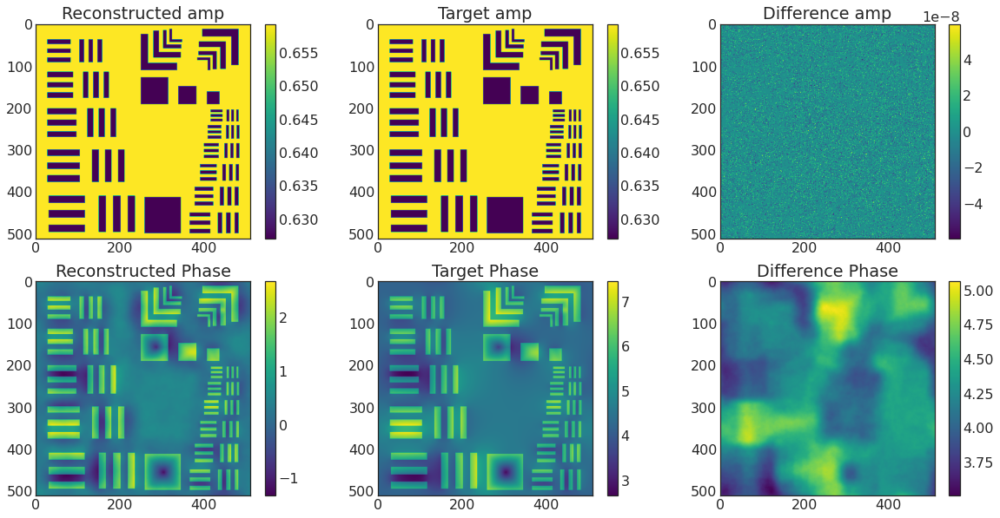

In [ ]:
intens = result[0][0]
phase = result[0][1]
unwrapped_phase = unwrap_phase(phase)

fig,ax = plt.subplots(2,3, figsize=(20,10))
im=ax[0,0].imshow(intens)
ax[0,0].set_title("Reconstructed amp")
plt.colorbar(im, ax=ax[0,0])
im=ax[0,1].imshow(np.abs(truth))
ax[0,1].set_title("Target amp")
plt.colorbar(im, ax=ax[0,1])
im=ax[0,2].imshow(np.abs(truth)-intens)
ax[0,2].set_title("Difference amp")
plt.colorbar(im, ax=ax[0,2])

im=ax[1,0].imshow(unwrapped_phase)
ax[1,0].set_title("Reconstructed Phase")
plt.colorbar(im, ax=ax[1,0])
im=ax[1,1].imshow(Ph_true)
ax[1,1].set_title("Target Phase")
plt.colorbar(im, ax=ax[1,1])
im=ax[1,2].imshow(Ph_true-unwrapped_phase)
ax[1,2].set_title("Difference Phase")
plt.colorbar(im, ax=ax[1,2])


In [ ]:
np.save(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32_b.txt", np.vstack([tot_accs[0], tot_errs[0]]))

In [ ]:
np.save(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32_b.npy", result[0][1])

2.7326177401961855 -2.1775863127289243


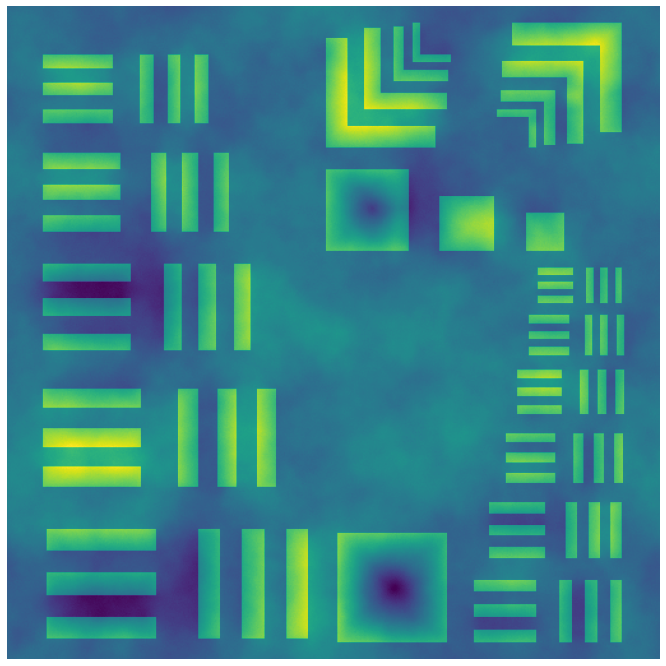

In [ ]:
f, ax = plt.subplots(figsize=(12,12))
phase = result[0][1]
tt = unwrap_phase(phase)
ax.imshow(tt-tt.mean(), vmin=-2.12, vmax=2.67)#, interpolation='none')
print((tt-tt.mean()).max(), (tt-tt.mean()).min())
ax.set_axis_off()
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig8_8.png", dpi=None, facecolor='w', edgecolor='w',
plt.savefig("/content/drive/My Drive/paper/"+"fig6_32_b.png", dpi=None, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

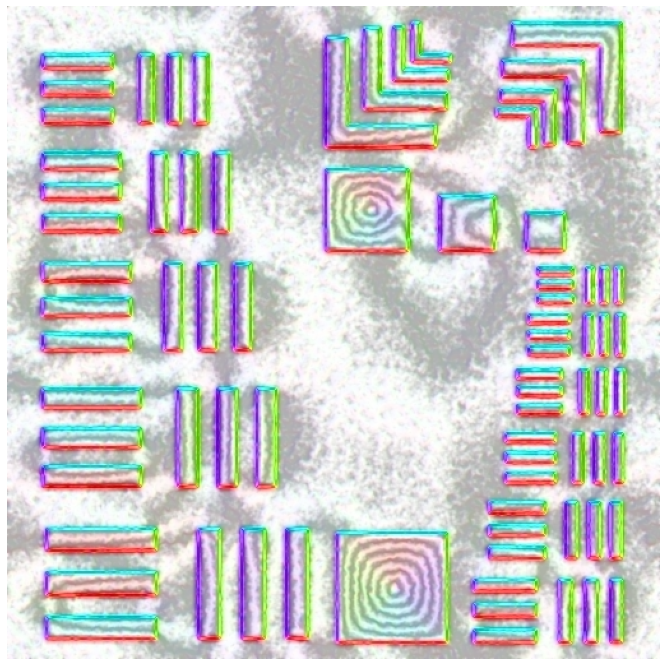

In [ ]:

tphi2=ndimage.gaussian_filter(tt-np.mean(tt),2,order=0)
gx=np.gradient(tphi2,axis=0)
gy=np.gradient(tphi2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
f, ax = plt.subplots(figsize=(12,12))
ax.imshow(rgb_map)
ax.imshow(np.cos(tt*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1)
ax.set_axis_off()
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig8_8_grad.png", dpi=None, facecolor='w', edgecolor='w',
#plt.savefig("/content/drive/My Drive/paper/"+"fig6_32_grad_b.png", dpi=None, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2+mag_y**2)**0.5
  return mag_mag

#f, ax = plt.subplots(figsize=(12,12))
#ax.imshow(calc_mag(tt-tt.mean()), vmin=0, vmax=0.2, interpolation='none')
#ax.set_axis_off()
#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig5_64_phamp.png", dpi=None, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
ddd = np.linspace(0,64,1+8)
ddd = np.round(ddd, 0).astype(int)
print(ddd)
tf_microscope = np.load("tf_microscope_noise30.npy")[ddd]
A_samples = np.load("A_samples_noise30.npy")[ddd]
print(A_samples.shape)

[ 0  8 16 24 32 40 48 56 64]
(9, 512, 512)


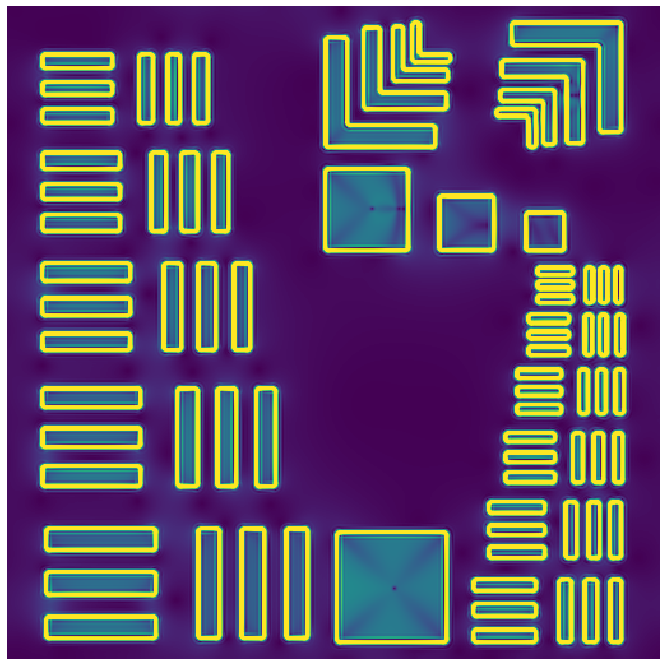

In [ ]:
#mag_mag1 = calc_mag(unwrapped_phase)
#mag_mag2 = calc_mag(Ph_true)

f, ax = plt.subplots(figsize=(12,12))
ax.imshow(calc_mag(ttt-ttt.mean()), vmin=0, vmax=0.2, interpolation='none')
ax.set_axis_off()
plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig2_noise0_TIE_phamp.png", dpi=None, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
compl = intens*np.exp(1j*phase)

#plot3([np_forward(compl),np_forward(guess), np.log10(np.abs(np_forward(compl)-np_forward(guess))+1e-10)], \
#      ["Guess diffr", "Actual diffr", "Difference image"])

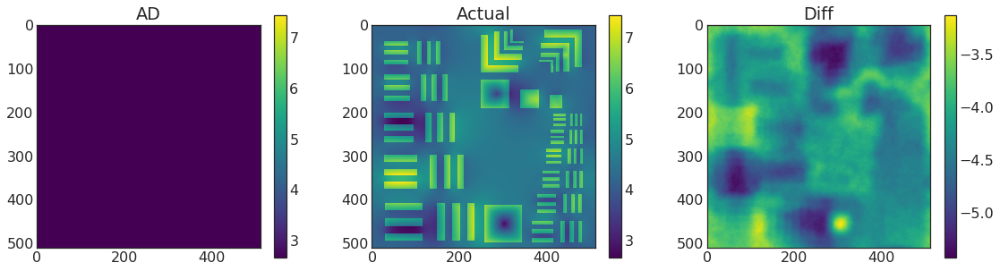

In [ ]:
unwrapped_true = unwrap_phase(Ph_true)
plot3([unwrapped_phase,unwrapped_true,unwrapped_phase-Ph_true],["AD", "Actual", "Diff"])


In [ ]:
def calc_mag(phase):
    grad_y, grad_x = np.gradient(phase)
    mag_x = grad_y
    mag_y = -1*grad_x
    mag_mag = (mag_x**2+mag_y**2)**0.5
    return mag_mag

mag_mag1 = calc_mag(unwrapped_phase)
mag_mag2 = calc_mag(unwrapped_true)

plot3([mag_mag1,mag_mag2,np.abs((mag_mag2-mag_mag1)%(2*np.pi)-np.pi)-np.pi], \
      ["AD mag", "Actual mag", "Difference image"])


tt = np.abs(np.abs((mag_mag2-mag_mag1)%(2*np.pi)-np.pi)-np.pi)
print (tt[100:,:100][mag_mag2[100:,:100]>1].mean())
print (tt[:75,:150][mag_mag2[:75,:150]>1].mean())
print (tt[75:,100:][mag_mag2[75:,100:]>1].mean())




NameError: ignored

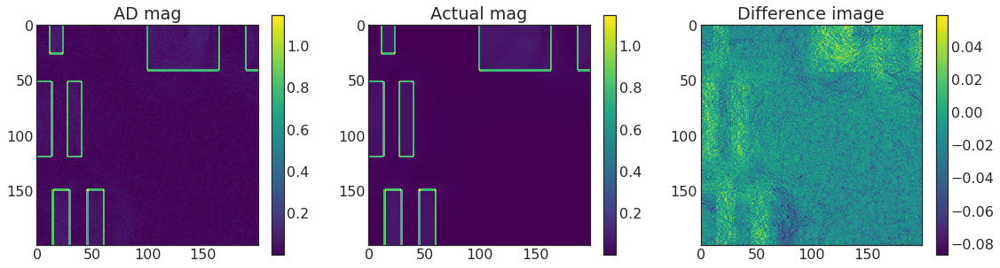

In [ ]:
plot3([mag_mag1[zoom1:zoom2,zoom1:zoom2],
       mag_mag2[zoom1:zoom2,zoom1:zoom2],
       (mag_mag2-mag_mag1)[zoom1:zoom2,zoom1:zoom2]], \
      ["AD mag", "Actual mag", "Difference image"])

Test Tensorflow's TV function

In [ ]:
phase_tf = tf.Variable(phase, dtype='float32')
a=tf.image.total_variation(tf.reshape(phase_tf,[h,w,1]))
print(a.numpy())

155059.69


In [ ]:
for iddd in range(2,33,2):
  ddd = np.linspace(0,64,1+iddd)
  ddd = np.round(ddd, 0).astype(int)
  print(iddd, ddd)
  tf_microscope = np.load(path+"tf_microscope.npy")[ddd]
  A_samples = np.load(path+"A_samples_noise_20.npy")[ddd]
  exp_img = tf.constant(A_samples, dtype=tf.float32)
  intens = tf.constant(A_sample, dtype='float32')
  phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')

  tot_errs = []
  tot_accs = []

  lrs = [1] #Use the best
  for lr in lrs:
    tot_iters = 10000
    init_lr = lr
    t1=time.time()
    result=optiz(1e-7,tot_iters,init_lr)
    t2=time.time()
    tot_errs.append(result[1])
    tot_accs.append(result[2])
    #print(t2-t1)

    #output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
  print(iddd, tot_accs[0][-1])

2 [ 0 32 64]
Ran 10000 iterations
2 0.75853896
4 [ 0 16 32 48 64]
Ran 10000 iterations
4 0.84200805
6 [ 0 11 21 32 43 53 64]
Ran 10000 iterations
6 0.8853937
8 [ 0  8 16 24 32 40 48 56 64]
Ran 10000 iterations
8 0.8897254
10 [ 0  6 13 19 26 32 38 45 51 58 64]
Ran 10000 iterations
10 0.89298135
12 [ 0  5 11 16 21 27 32 37 43 48 53 59 64]
Ran 10000 iterations
12 0.89643824
14 [ 0  5  9 14 18 23 27 32 37 41 46 50 55 59 64]
Ran 10000 iterations
14 0.90225244
16 [ 0  4  8 12 16 20 24 28 32 36 40 44 48 52 56 60 64]
Ran 10000 iterations
16 0.9022061
18 [ 0  4  7 11 14 18 21 25 28 32 36 39 43 46 50 53 57 60 64]
Ran 10000 iterations
18 0.901959
20 [ 0  3  6 10 13 16 19 22 26 29 32 35 38 42 45 48 51 54 58 61 64]
Ran 10000 iterations
20 0.9023367
22 [ 0  3  6  9 12 15 17 20 23 26 29 32 35 38 41 44 47 49 52 55 58 61 64]
Ran 10000 iterations
22 0.9058226
24 [ 0  3  5  8 11 13 16 19 21 24 27 29 32 35 37 40 43 45 48 51 53 56 59 61
 64]
Ran 10000 iterations
24 0.90476286
26 [ 0  2  5  7 10 12 15 17 20

In [ ]:
for iddd in range(2,33,2):
  ddd = np.linspace(0,64,1+iddd)
  ddd = np.round(ddd, 0).astype(int)
  print(iddd, ddd)
  tf_microscope = np.load(path+"tf_microscope.npy")[ddd]
  A_samples = np.load(path+"A_samples_noise_30.npy")[ddd]
  exp_img = tf.constant(A_samples, dtype=tf.float32)
  intens = tf.constant(A_sample, dtype='float32')
  phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')

  tot_errs = []
  tot_accs = []

  lrs = [1] #Use the best
  for lr in lrs:
    tot_iters = 10000
    init_lr = lr
    t1=time.time()
    result=optiz(1e-7,tot_iters,init_lr)
    t2=time.time()
    tot_errs.append(result[1])
    tot_accs.append(result[2])
    #print(t2-t1)

    #output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
  print(iddd, tot_accs[0][-1])

2 [ 0 32 64]
Ran 10000 iterations
2 0.3199803
4 [ 0 16 32 48 64]
Ran 10000 iterations
4 0.7395772
6 [ 0 11 21 32 43 53 64]
Ran 10000 iterations
6 0.83103335
8 [ 0  8 16 24 32 40 48 56 64]
Ran 10000 iterations
8 0.8499236
10 [ 0  6 13 19 26 32 38 45 51 58 64]
Ran 10000 iterations
10 0.8575838
12 [ 0  5 11 16 21 27 32 37 43 48 53 59 64]
Ran 10000 iterations
12 0.86860836
14 [ 0  5  9 14 18 23 27 32 37 41 46 50 55 59 64]
Ran 10000 iterations
14 0.8820625
16 [ 0  4  8 12 16 20 24 28 32 36 40 44 48 52 56 60 64]
Ran 10000 iterations
16 0.8835719
18 [ 0  4  7 11 14 18 21 25 28 32 36 39 43 46 50 53 57 60 64]
Ran 10000 iterations
18 0.8831471
20 [ 0  3  6 10 13 16 19 22 26 29 32 35 38 42 45 48 51 54 58 61 64]
Ran 10000 iterations
20 0.88462913
22 [ 0  3  6  9 12 15 17 20 23 26 29 32 35 38 41 44 47 49 52 55 58 61 64]
Ran 10000 iterations
22 0.8915558
24 [ 0  3  5  8 11 13 16 19 21 24 27 29 32 35 37 40 43 45 48 51 53 56 59 61
 64]
Ran 10000 iterations
24 0.8922709
26 [ 0  2  5  7 10 12 15 17 20 2

0.28362846

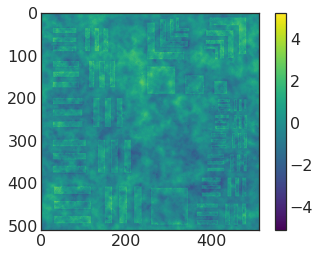

In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'

t1 = np.load(path+"AD_recons/noise30_tv1e9_guess0p5_iter100000_phase_2.npy")
#t1 = tif.imread(path+'TIE_recons/Stacknobg_noise30_s512_tphi.tiff.tif')[::-1]
#t1*=0
t1-=t1.mean()
t2 = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')
t2-=t2.mean()
plt.imshow(t1)
plt.colorbar()

corr2(t1,t2)

In [ ]:
def mean2(x):
    y = np.sum(x) / np.size(x);
    return y

def corr2(a,b):
    #a = a - mean2(a)
    #b = b - mean2(b)

    r = (a*b).sum() / np.sqrt((a*a).sum() * (b*b).sum());
    return r

corr2(t2,t2)

1.0

In [ ]:
0.945404
0.51393074
0.2806086
0.1452549

0.005580014168551764 1.946371377064037


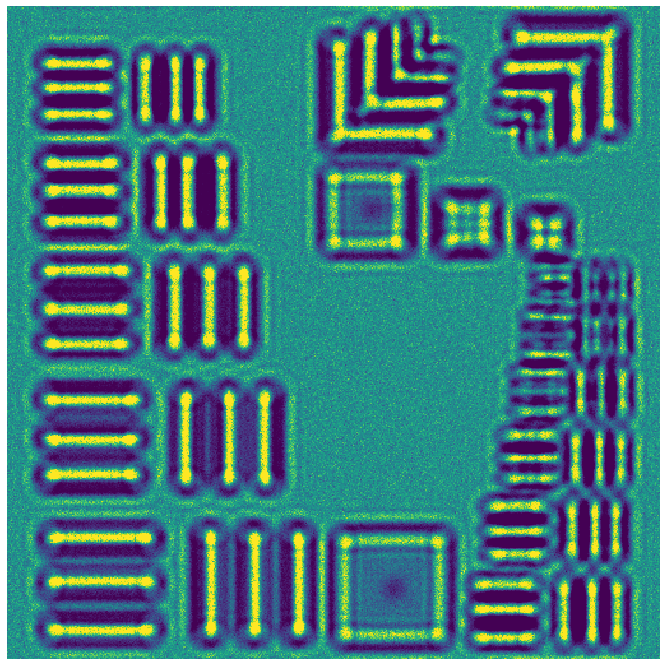

In [ ]:
f, ax = plt.subplots(figsize=(12,12))
tt = np.load(path+"amplitude4TIE_noise10.npy")[0]
#tt = np.load(path+"A_samples0.npy")[64]
ax.imshow(tt**2, vmin=.4, vmax=2, interpolation='none')
print(tt.min(), tt.max())
ax.set_axis_off()
plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figS1_b00.png", dpi=None, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
def compute_loss():
  tf_obj_real = intens*tf.math.cos(phase)
  tf_obj_imag = intens*tf.math.sin(phase)
  tf_obj = tf.complex(tf_obj_real, tf_obj_imag)

  guess_img = tfs.ifft2d(tfs.ifftshift(tfs.fftshift(tfs.fft2d(tf_obj))*tf_microscope, axes=(1,2)))

  guess_img = tf.abs(guess_img)
  guess_img /= tf.reduce_mean(guess_img, axis=(1,2), keepdims=True)
  losses = tf.reduce_mean((guess_img - exp_img)**2)

  global gerr 
  gerr = losses
  return losses

def optiz(tol=1e-7, max_iter=100, lr=0.01):
  err = np.Inf # step error (banach), not actual erro
  i = 0
  errs = []
  accs = []
  #print(lr)
  for i in (range(max_iter)):
    opt = tf.optimizers.Adam(learning_rate=lr)
    train = opt.minimize(compute_loss, var_list=[phase]) #Optim only over phase
    errs.append(gerr.numpy())
    ph_mean = phase.numpy()
    ph_mean -= ph_mean.mean()
    #accs.append(1-np.abs(ph_mean-Ph_true_mean).sum()/np.abs(ph_mean+Ph_true_mean).sum())
    accs.append((ph_mean*Ph_true_mean).sum() / np.sqrt((ph_mean*ph_mean).sum() * (Ph_true_mean*Ph_true_mean).sum()))
    i += 1

  print ("Ran %d iterations" %i)
  return [intens.numpy(), phase.numpy()], errs, accs

In [ ]:
exp_img = tf.constant(A_samples, dtype=tf.float32)
intens = tf.constant(A_sample, dtype='float32')
phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')
lamb2 = 1e-7 #Add TV minimization for phase

In [ ]:
for i in range(10):
  t1=time.time()

  for j in range(4):
    tot_iters = 100000
    init_lr = 1
    if j == 0:
      exp_img = tf.constant(A_samples[:300,:300], dtype=tf.float32)
      intens = tf.constant(A_sample[:300,:300], dtype='float32')
      phase = tf.Variable(np.zeros(A_sample[:300,:300].shape)+0.5, dtype='float32')
      result=optiz(1e-7,tot_iters,init_lr)
      p0 = np.copy(phase.numpy())
    if j == 1:
      exp_img = tf.constant(A_samples[-300:,:300], dtype=tf.float32)
      intens = tf.constant(A_sample[-300:,:300], dtype='float32')
      phase = tf.Variable(np.zeros(A_sample[-300:,:300].shape)+0.5, dtype='float32')
      result=optiz(1e-7,tot_iters,init_lr)
      p1 = np.copy(phase.numpy())
    if j == 2:
      exp_img = tf.constant(A_samples[:300,-300:], dtype=tf.float32)
      intens = tf.constant(A_sample[:300,-300:], dtype='float32')
      phase = tf.Variable(np.zeros(A_sample[:300,-300:].shape)+0.5, dtype='float32')
      result=optiz(1e-7,tot_iters,init_lr)
      p2 = np.copy(phase.numpy())
    if j == 3:
      exp_img = tf.constant(A_samples[-300:,-300:], dtype=tf.float32)
      intens = tf.constant(A_sample[-300:,-300:], dtype='float32')
      phase = tf.Variable(np.zeros(A_sample[-300:,-300:].shape)+0.5, dtype='float32')
      result=optiz(1e-7,tot_iters,init_lr)
      p3 = np.copy(phase.numpy())
    #p1 += (p0[-44:].mean()-p1[44:].mean())
    #p2 += (p0[:,-44:].mean()-p2[:,44:].mean())
    #p3 += (p2[-44:].mean()-p3[44:].mean())

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [1] #Use the best
for i in range(4):
  if i==0:
    tot_iters = 1000
    init_lr = lr
    t1=time.time()
    result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

Test

In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
#path = '/content/drive/My Drive/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')[:300,:300]
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')[:300,:300]

A_samples = np.load(path+"A_samples_noise_0.npy")[:,:300,:300]

print(A_samples.shape)

(65, 300, 300)


In [ ]:
sys.path.append('/content/drive/My Drive/')

from microscopes_fwd import Microscope

#inititiate microscope class
TEM = Microscope(Cs = 1.0e6, theta_c = 0.01e-3, def_spr = 500)

#reciprocal space vectors
[dim,dim] = A_sample.shape
d2=dim/2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 5 #nm/px

#set the desired defocus of the microscope
#TEM.defocus = 500000.0 #nm

#get transfer function
#tf_microscope = TEM.getTransferFunction(qq, del_px)

#save TF as numpy array
#np.save('TF_microscope_def%d' %TEM.defocus, tf_microscope)

In [ ]:
defocus = np.linspace(0,.16e6,65)
print(defocus)

tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)
for i in range(defocus.shape[0]):
  TEM.defocus = defocus[i]
  tf_microscope[i] = TEM.getTransferFunction(qq, del_px)

A_samples = A_samples#[::8]
tf_microscope = tf_microscope#[::8]

print(A_samples.shape)

[     0.   2500.   5000.   7500.  10000.  12500.  15000.  17500.  20000.
  22500.  25000.  27500.  30000.  32500.  35000.  37500.  40000.  42500.
  45000.  47500.  50000.  52500.  55000.  57500.  60000.  62500.  65000.
  67500.  70000.  72500.  75000.  77500.  80000.  82500.  85000.  87500.
  90000.  92500.  95000.  97500. 100000. 102500. 105000. 107500. 110000.
 112500. 115000. 117500. 120000. 122500. 125000. 127500. 130000. 132500.
 135000. 137500. 140000. 142500. 145000. 147500. 150000. 152500. 155000.
 157500. 160000.]
(65, 300, 300)


In [ ]:
truth = A_sample*np.exp(1j*Ph_true)
Ph_true_mean = Ph_true-Ph_true.mean()

In [ ]:
def compute_loss():
  tf_obj_real = intens*tf.math.cos(phase)
  tf_obj_imag = intens*tf.math.sin(phase)
  tf_obj = tf.complex(tf_obj_real, tf_obj_imag)

  guess_img = tfs.ifft2d(tfs.ifftshift(tfs.fftshift(tfs.fft2d(tf_obj))*tf_microscope, axes=(1,2)))

  guess_img = tf.abs(guess_img)
  guess_img /= tf.reduce_mean(guess_img, axis=(1,2), keepdims=True)
  #losses = tf.reduce_mean(tf.abs(guess_img - exp_img))
  losses = tf.reduce_mean((guess_img - exp_img)**2)#+ \
#            lamb2*tf.image.total_variation(tf.reshape(phase,[h,w,1]))
#           lamb1*tf.image.total_variation(tf.reshape(intens,[h,w,1]))+ 

  global gerr 
  gerr = losses
  return losses

def optiz(tol=1e-7, max_iter=100, lr=0.01):
  err = np.Inf # step error (banach), not actual erro
  i = 0
  errs = []
  accs = []
  #print(lr)
  for i in (range(max_iter)):
    opt = tf.optimizers.Adam(learning_rate=lr)
    train = opt.minimize(compute_loss, var_list=[phase]) #Optim only over phase
    errs.append(gerr.numpy())
    ph_mean = phase.numpy()
    ph_mean -= ph_mean.mean()
    accs.append((ph_mean*Ph_true_mean).sum() / np.sqrt((ph_mean*ph_mean).sum() * (Ph_true_mean*Ph_true_mean).sum()))  #################
    i += 1

  print ("Ran %d iterations" %i)
  return [intens.numpy(), phase.numpy()], errs, accs

In [ ]:
exp_img = tf.constant(A_samples, dtype=tf.float32)
intens = tf.constant(A_sample, dtype='float32')
#phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')
##ttt = tif.imread(path+'TIE_recons/Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
#ttt = np.load(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32.npy")
phase = tf.Variable(Ph_true, dtype='float32')
#phase = tf.Variable(ttt, dtype='float32')
#lamb1 = 1e-9 #Add TV minimization for intens
lamb2 = 1e-7 #Add TV minimization for phase

In [ ]:
tot_errs = []
tot_accs = []
#phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [.5] #Use the best
for lr in lrs:
  tot_iters = 2000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

Ran 2000 iterations
36.28041362762451
0.98220414


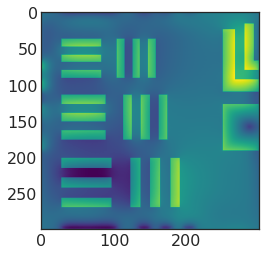

In [ ]:
plt.imshow(phase.numpy())

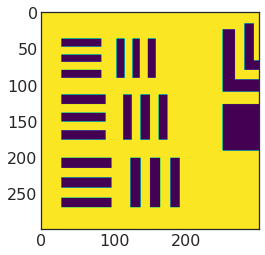

In [ ]:
#plt.imshow(Ph_true)
plt.imshow(A_samples[0])

No handles with labels found to put in legend.


Text(0, 0.5, 'Log(mean squared error)')

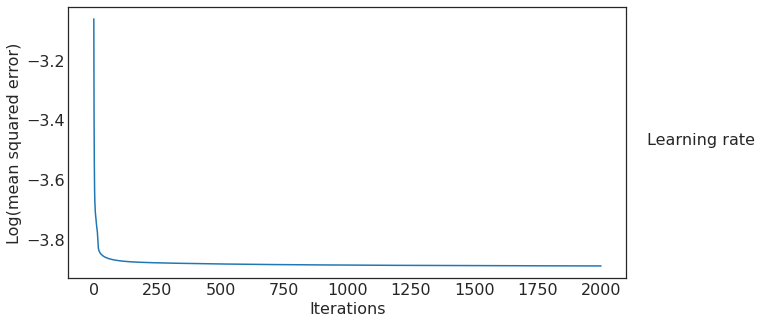

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
#for i in range(len(tot_errs)):
ax.plot(np.log10(np.array(tot_errs).flatten()))
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("Log(mean squared error)")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()

No handles with labels found to put in legend.


0.999303


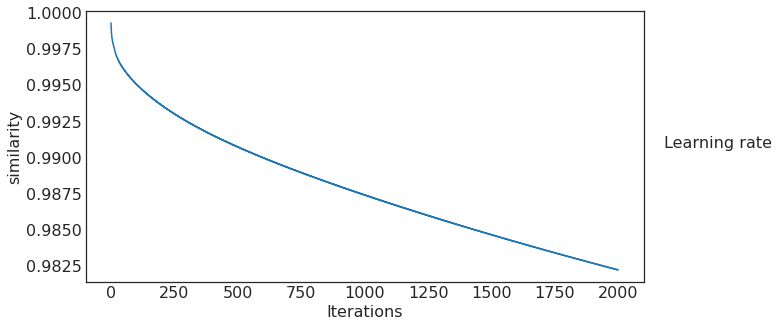

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
for i in range(len(tot_accs)):
  ax.plot(np.array(tot_accs).flatten())
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("similarity")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()
print(np.array(tot_accs).max())

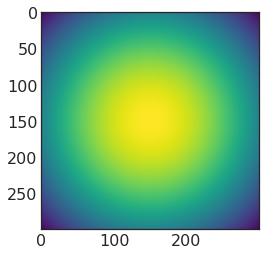

In [ ]:
plt.imshow(np.abs(tf_microscope[-1]), vmin=0.6, vmax=1)

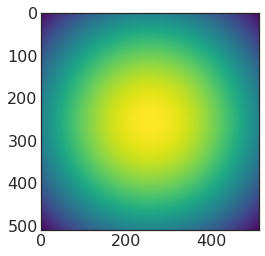

In [ ]:
plt.imshow(np.abs(tf_microscope[-1]), vmin=0.6, vmax=1)

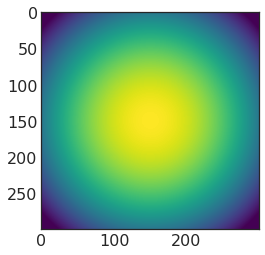

In [ ]:
plt.imshow(np.abs(tf_microscope[4]), vmin=0.9, vmax=1)

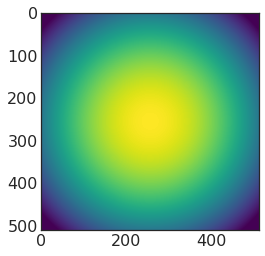

In [ ]:
plt.imshow(np.abs(tf_microscope[4]), vmin=0.9, vmax=1)

In [ ]:
A_sample =  tif.imread(path+'restest_design_amp.tiff')[:300,:300]
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')[:300,:300]
defocus = np.linspace(0,.16e6,65)

A_samples = np.zeros((defocus.shape[0], A_sample.shape[0], A_sample.shape[1]))


sys.path.append('/content/drive/My Drive/')

from microscopes_fwd import Microscope

#inititiate microscope class
TEM = Microscope(Cs = 1.0e6, theta_c = 0.01e-3, def_spr = 500)

#reciprocal space vectors
[dim,dim] = A_sample.shape
d2=dim/2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 5 #nm/px

#set the desired defocus of the microscope
#TEM.defocus = 500000.0 #nm

#get transfer function
#tf_microscope = TEM.getTransferFunction(qq, del_px)

#save TF as numpy array
#np.save('TF_microscope_def%d' %TEM.defocus, tf_microscope)


tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)
for i in range(defocus.shape[0]):
  TEM.defocus = defocus[i]
  tf_microscope[i] = TEM.getTransferFunction(qq, del_px)
  A_samples[i] = np.abs((ifft2(tf_microscope[i]*fftshift(fft2(A_sample*np.exp(1j*Ph_true))))))

In [ ]:
B_samples = np.copy(A_samples)

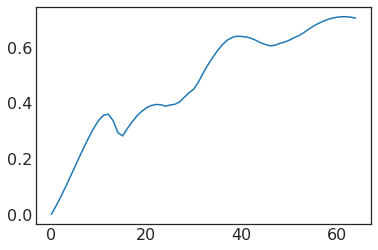

In [ ]:
plt.plot(np.abs(B_samples[:,:300,:300]-A_samples).max(1).max(1))

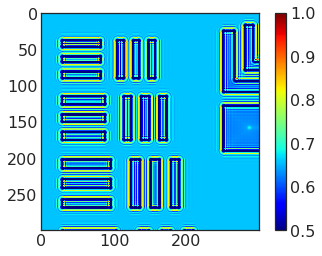

In [ ]:
plt.imshow(B_samples[-1,:300,:300], cmap='jet', vmin=0.5, vmax=1)
plt.colorbar()

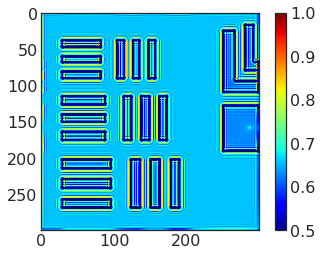

In [ ]:
plt.imshow(A_samples[-1], cmap='jet', vmin=0.5, vmax=1)
plt.colorbar()

In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

tt = fabio.open(path + "tie_recons/FS3_restest_q_10mu_0_2s_alimj_crp_1_12_25_tphi.tiff").data[::-1][185:697,:512]
ttt = np.load(path+"AD_recons/exp_ADrecon_0p2s_400kiter.npy")
tt-=tt.mean()
ttt-=ttt.mean()
#plt.imshow(tt)
plt.imshow(ttt)

In [ ]:
tphi2=ndimage.gaussian_filter(Ph_true-np.mean(Ph_true),2,order=0)
gx=np.gradient(tphi2,axis=0)
gy=np.gradient(tphi2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
f, ax = plt.subplots(figsize=(12,12))
ax.imshow(rgb_map[455:460])
ax.imshow(np.cos(Ph_true[455:460]*10), cmap=plt.cm.gray, alpha=.3, vmin=-1, vmax=1)
ax.set_axis_off()

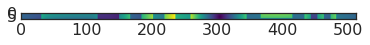

In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

Ph_true -= Ph_true.mean()

def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2+mag_y**2)**0.5
  return mag_mag

plt.imshow(Ph_true[450:460])

(-3.0, 2.6)


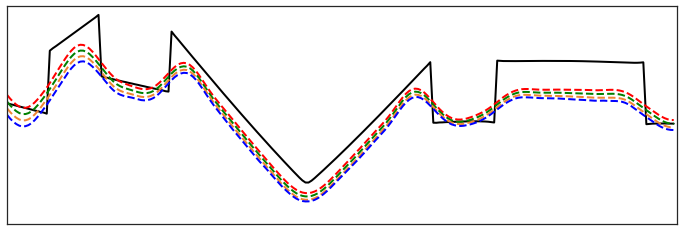

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot((Ph_true-Ph_true.mean())[457,205:425], 'k-', linewidth=2)


ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_nonoise_tphi-1.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'r--', linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise10_tphi-1.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'g--', linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise20_tphi-1.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise30_tphi-1.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'b--', linewidth=2)


ax.set_xlim(0, 220)
ax.set_ylim(-3, 2.6)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figS2_TIE_cut_far.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

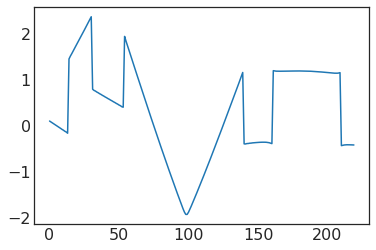

In [ ]:
plt.plot((Ph_true)[457,205:425])

'\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_3436_5000iter_noisyamp.npy")\nttt -= ttt.mean()\nax.plot(calc_mag(ttt)[457,205:425], \'b\')\n\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise14_34363864_5000iter_noisyamp.npy")\nttt -= ttt.mean()\nplt.plot(calc_mag(ttt)[457,205:425], \'orange\')\n\nttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_10kiter_noisyamp.npy")\nttt -= ttt.mean()\nplt.plot(calc_mag(ttt)[457,205:425], \'r\')\n\n\n'

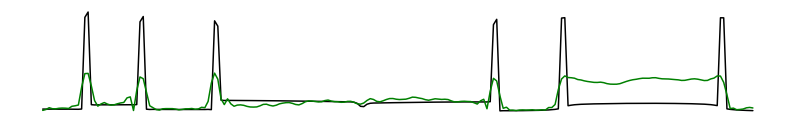

In [ ]:
f, ax = plt.subplots(figsize=(14,2))
ax.set_axis_off()
ax.plot(calc_mag(Ph_true)[457,205:425], 'k')

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise10_olddef_tphi-1.tif')[::-1]
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425],'g')



"""
ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_3436_5000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot(calc_mag(ttt)[457,205:425], 'b')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise14_34363864_5000iter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'orange')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_10kiter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'r')


"""

#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"fig3_cut_close_green.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)


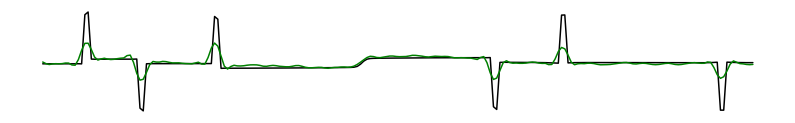

In [ ]:
f, ax = plt.subplots(figsize=(14,2))
ax.set_axis_off()
ax.plot(np.gradient(Ph_true)[1][457,205:425], 'k')

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/'+'Stack_noise10_olddef_tphi-1.tif')[::-1]
ttt -= ttt.mean()
plt.plot(np.gradient(ttt)[1][457,205:425],'g')



"""
ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_3436_5000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot(calc_mag(ttt)[457,205:425], 'b')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise14_34363864_5000iter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'orange')

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_10kiter_noisyamp.npy")
ttt -= ttt.mean()
plt.plot(calc_mag(ttt)[457,205:425], 'r')


"""

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"fig3_cut_close_green.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)


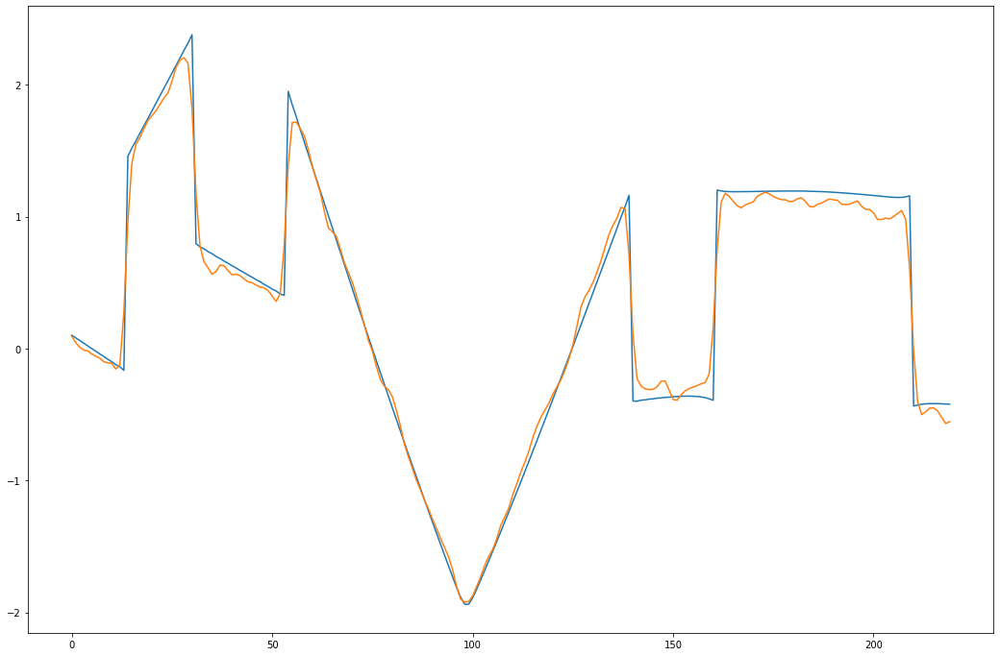

In [ ]:
plt.figure(figsize=(18,12))
tt = phase.numpy()
tt=ndimage.gaussian_filter(tt-np.mean(tt),1,order=0)
plt.plot((Ph_true-Ph_true.mean())[457,205:425])
plt.plot(tt[457,205:425])

(-3.0, 2.6)


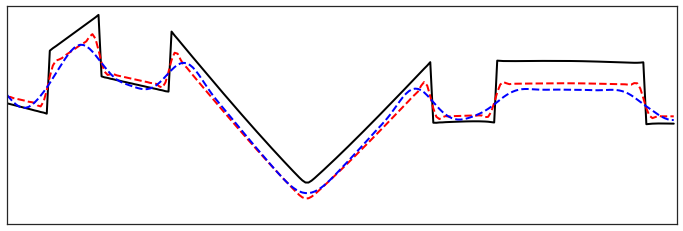

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot((Ph_true-Ph_true.mean())[457,205:425], 'k-', linewidth=2)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_nonoise_olddef_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'r--', linewidth=2)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_olddef_tphi-1.tif")[::-1]
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], 'g--', linewidth=2)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_nonoise_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'b--', linewidth=2)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_tphi-1.tif")[::-1]
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=2)


#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_2935_0000iter_noisyamp.npy")
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=2)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_5000iter_noisyamp.npy")
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], 'b--', linewidth=2)


ax.set_xlim(0, 220)
ax.set_ylim(-3, 2.6)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figS2_TIE_cut.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

(-3.0, 2.6)


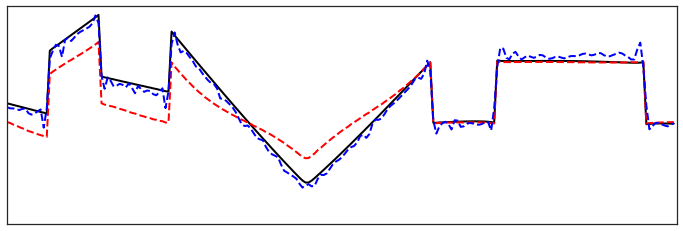

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot((Ph_true-Ph_true.mean())[457,205:425], 'k-', linewidth=2)

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise0_2935_5000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'r--', linewidth=2)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_2935_5000iter_noisyamp.npy")
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], 'g--', linewidth=2)

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise0_064_5000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'b--', linewidth=2)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_5000iter_noisyamp.npy")
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=2)



ax.set_xlim(0, 220)
ax.set_ylim(-3, 2.6)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figS2_AD_cut.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

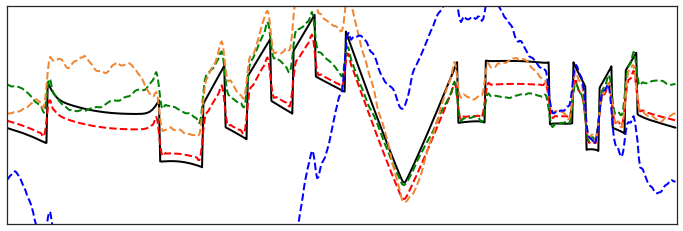

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot((Ph_true)[457], 'k-', linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457], 'r--', linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_noise10_s512_tphi.tiff.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457], 'g--', linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_noise20_s512_tphi.tiff.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457], '--', color="#EF8633", linewidth=2)

ttt = tif.imread('/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/TIE_recons/'+'Stacknobg_noise30_s512_tphi.tiff.tif')[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457], 'b--', linewidth=2)


ax.set_xlim(0, 512)
ax.set_ylim(-3, 2.6)
ax.set_xticklabels([])
ax.set_yticklabels([])

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"fig2_TIE_cut.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

(-3.0, 2.6)


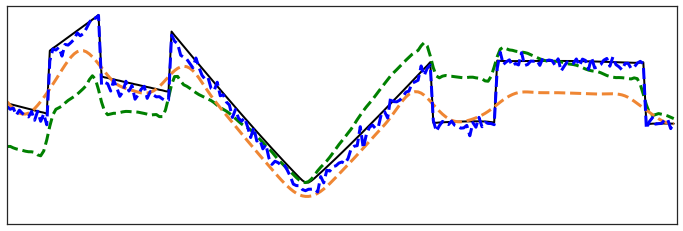

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot((Ph_true-Ph_true.mean())[457,205:425], 'k-', linewidth=2)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_olddef_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'g--', linewidth=3)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=3)

ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_34366466_20000iter_noisyamp.npy")
ttt -= ttt.mean()
ax.plot((ttt)[457,205:425], 'b--', linewidth=3)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_064_5000iter_noisyamp.npy")
#ttt -= ttt.mean()
#ax.plot((ttt)[457,205:425], '--', color="#EF8633", linewidth=2)



ax.set_xlim(0, 220)
ax.set_ylim(-3, 2.6)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"fig3_phase_cut.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

(-0.5, 1.1)


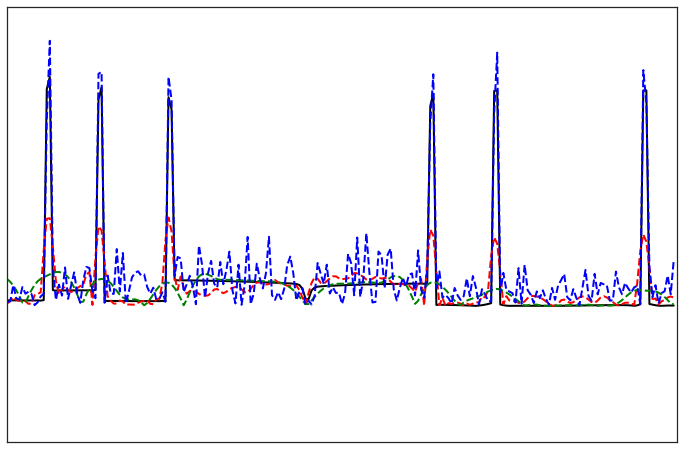

In [ ]:
def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2*0+mag_y**2)**0.5
  return mag_mag

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(calc_mag(Ph_true)[457,205:425], 'k-', linewidth=2)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_2935_20000iter_noisyamp.npy")
#ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),1,order=0)
#ax.plot(calc_mag(ttt)[457,205:425], 'g--', linewidth=2)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_34366466_20000iter_noisyamp.npy")
#ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),1,order=0)
#ax.plot(calc_mag(ttt)[457,205:425], 'b--', linewidth=2)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_olddef_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot(calc_mag(ttt)[457,205:425], 'r--', linewidth=2)

ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise10_tphi-1.tif")[::-1]
ttt -= ttt.mean()
ax.plot(calc_mag(ttt)[457,205:425], 'g--', linewidth=2)


ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_34366466_20000iter_noisyamp.npy")
ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),0,order=0)
ax.plot(calc_mag(ttt)[457,205:425], 'b--', linewidth=2)


ax.set_xlim(0, 220)
ax.set_ylim(-0.5, 1.1)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"fig3_TIE_cut.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

(-0.1, 1.3)


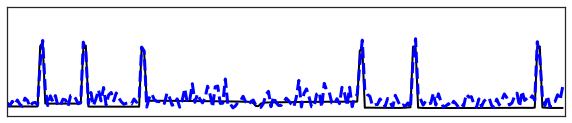

In [ ]:
def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2*0+mag_y**2)**0.5
  return mag_mag

fig, ax = plt.subplots(figsize=(10,2))
ax.plot(calc_mag(Ph_true)[457,205:425], 'k-', linewidth=2)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise20_olddef_tphi-1.tif")[::-1]
#ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),0,order=0)
#ax.plot(calc_mag(ttt)[457,205:425], 'g--', linewidth=3)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise20_tphi-1.tif")[::-1]
#ttt -= ttt.mean()
#ax.plot(calc_mag(ttt)[457,205:425], '--', color="#EF8633", linewidth=3)

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise20_34366264_20000iter_noisyamp.npy")
#ttt=ndimage.gaussian_filter(ttt-np.mean(ttt),0,order=0)
#ax.plot(calc_mag(ttt)[457,205:425], 'b--', linewidth=3)



ax.set_xlim(0, 220)
ax.set_ylim(-0.1, 1.3)
ax.set_xticklabels([])
ax.set_yticklabels([])
print(ax.get_ylim())

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"figs3_cut3.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

0.9855993
FWHM: 0.9
Area: 1.788
Cen: 8.5


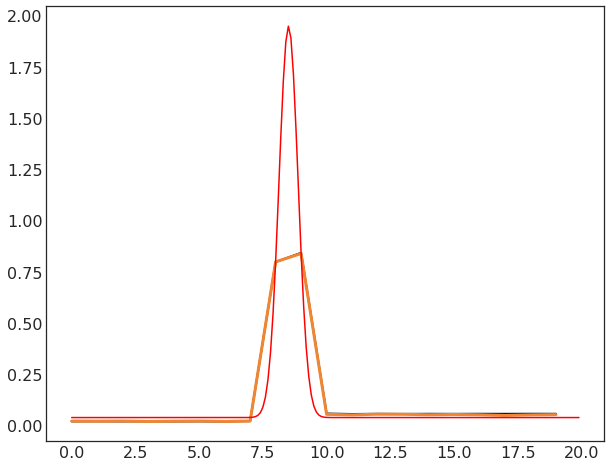

In [ ]:
from math import *
from scipy.optimize import curve_fit

fig, ax = plt.subplots(figsize=(10,8))


ax.plot(calc_mag(Ph_true)[457,210:230], 'k-', linewidth=2)

#ttt = tif.imread("/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/new_TIE_recons/"+"Stack_noise20_tphi-1.tif")[::-1]
ttt = phase.numpy()

#ttt = np.load("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"noise10_34366466_20000iter_noisyamp.npy")
ttt -= ttt.mean()

Ph_true_mean = Ph_true-Ph_true.mean()
print((ttt*Ph_true_mean).sum() / np.sqrt((ttt*ttt).sum() * (Ph_true_mean*Ph_true_mean).sum()))


ttt = calc_mag(ttt)[457,210:230]
ax.plot(ttt, 'b-', color="#EF8633", linewidth=3)

x0 = np.arange(20)
x1 = np.arange(0,20,0.1)


def gaussian(x, y0, A, x0, w):
    return y0 + A * np.exp(-4*log(2)*(x-x0)**2/w**2) / w / sqrt(pi/4./log(2))

popt,pcov = curve_fit(gaussian,x0,ttt,p0=[0, ttt.sum(),ttt.argmax(),1])


ax.plot(x1,gaussian(x1,*popt),'r',label='fit')

print("FWHM: {0:.1f}".format(popt[3]))
print("Area: {0:.3f}".format(popt[1]))
print("Cen: {0:.1f}".format(popt[2]))




In [ ]:
!pip install fabio
import fabio

     |████████████████████████████████| 1.9MB 2.8MB/s 


     |████████████████████████████████| 2.3MB 8.0MB/s 


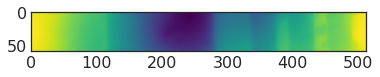

In [ ]:
!pip install fabio
import fabio
path = '/content/drive/My Drive/expt_test_data/res_test_pattern/'

tt = fabio.open(path + "tie_recons/FS2_restest_q_10mu_2s_alimj_crp_1_12_25_tphi.tiff").data[::-1][185:697,:512]
ttt = np.load(path+"AD_recons/exp_ADrecon_0p2s_400kiter.npy")
tt-=tt.mean()
ttt-=ttt.mean()
#plt.imshow(tt)
plt.imshow(ttt[340:400])

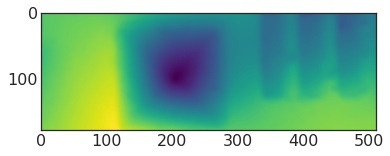

In [ ]:
plt.imshow(tt[230:410])

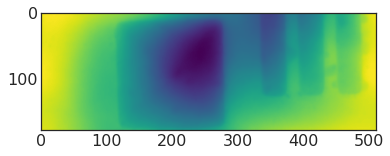

In [ ]:
plt.imshow(ttt[280:460])

[]

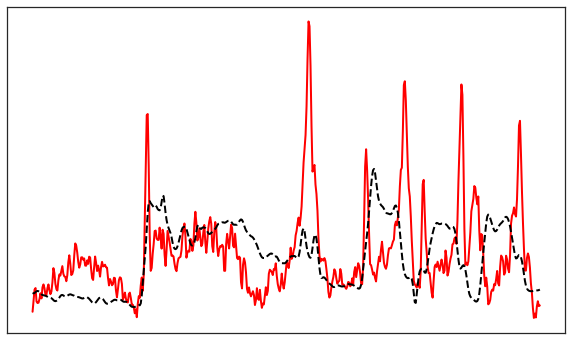

In [ ]:
def calc_mag(phase):
  grad_y, grad_x = np.gradient(phase)
  mag_x = grad_y
  mag_y = -1*grad_x
  mag_mag = (mag_x**2+mag_y**2)**0.5
  return mag_mag

fig, ax = plt.subplots(figsize=(10,6))


ax.plot(calc_mag(ttt)[360], 'r-', linewidth=2)
ax.plot(calc_mag(tt)[360], 'k--', linewidth=2)
ax.set_xticklabels([])
ax.set_yticklabels([])

#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/paper/"+"exp_cut_b.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

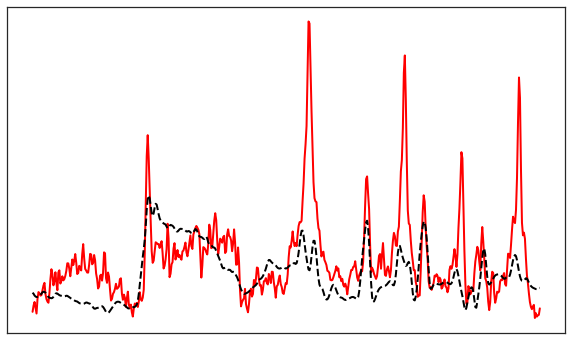

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(calc_mag(ttt)[370], 'r-', linewidth=2)
ax.plot(calc_mag(tt)[320], 'k--', linewidth=2)
ax.set_xticklabels([])
ax.set_yticklabels([])

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"exp_cut.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

#AAAA


In [ ]:
path = '/content/drive/My Drive/new_test_data_for_ADLorentz/res_test_pattern/'
#path = '/content/drive/My Drive/res_test_pattern/'

A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

tf_microscope = np.load(path+"tf_microscope.npy")[:3]
A_samples = np.load(path+"A_samples_noise_10.npy")[:3]
print(A_samples.shape)

(3, 512, 512)


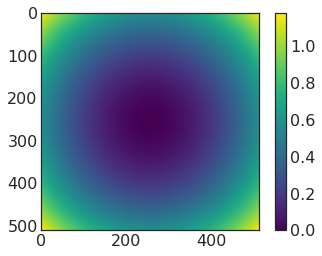

In [ ]:
plt.imshow(np.angle(np.load(path+"tf_microscope.npy")[3]), interpolation='none')
plt.colorbar()

In [ ]:
truth = A_sample*np.exp(1j*Ph_true)
Ph_true_mean = Ph_true-Ph_true.mean()

h,w = A_sample.shape[0], A_sample.shape[1]
zoom1, zoom2 = 150,350

In [ ]:
def compute_loss():
  tf_obj_real = intens*tf.math.cos(phase)
  tf_obj_imag = intens*tf.math.sin(phase)
  tf_obj = tf.complex(tf_obj_real, tf_obj_imag)

  guess_img = tfs.ifft2d(tfs.ifftshift(tfs.fftshift(tfs.fft2d(tf_obj))*tf_microscope, axes=(1,2)))

  guess_img = tf.abs(guess_img)
  guess_img /= tf.reduce_mean(guess_img, axis=(1,2), keepdims=True)
  #losses = tf.reduce_mean(tf.abs(guess_img - exp_img))
  losses = tf.reduce_mean((guess_img - exp_img)**2)+ \
             lamb1*tf.image.total_variation(tf.reshape(intens,[h,w,1]))#+ 
#            lamb2*tf.image.total_variation(tf.reshape(phase,[h,w,1]))


  global gerr 
  gerr = losses
  return losses

def optiz(tol=1e-7, max_iter=100, lr=0.01):
  err = np.Inf # step error (banach), not actual erro
  i = 0
  errs = []
  accs = []
  acc0 = 0
  #print(lr)
  for i in (range(max_iter)):
    opt = tf.optimizers.Adam(learning_rate=lr)
    train = opt.minimize(compute_loss, var_list=[intens]) #Optim only over phase
    errs.append(gerr.numpy())
    amp_mean = intens.numpy()
    amp_mean /= amp_mean.mean()
    acc1 = (amp_mean*A_sample).sum() / np.sqrt((amp_mean*amp_mean).sum() * (A_sample*A_sample).sum())
    if acc1<acc0:
      break
    accs.append(acc1)  #################
    acc0 = acc1
    i += 1

  print ("Ran %d iterations" %i)
  return [intens.numpy(), phase.numpy()], errs, accs

In [ ]:
exp_img = tf.constant(A_samples, dtype=tf.float32)
#intens = tf.constant(A_sample, dtype='float32')
intens = tf.Variable(A_samples[0], dtype='float32')
phase = tf.constant(np.zeros(A_sample.shape), dtype='float32')
##ttt = tif.imread(path+'TIE_recons/Stacknobg_nonoise_s512_tphi.tiff.tif')[::-1]
#ttt = np.load(path+"AD_recons/noise20_tv1e9_guess0p5_iter100000_phase_32.npy")
#phase = tf.Variable(ttt, dtype='float32')
#lamb1 = 1e-9 #Add TV minimization for intens
lamb1 = 1e-7 #Add TV minimization for phase

In [ ]:
tot_errs = []
tot_accs = []
phase = tf.Variable(phase, dtype='float32')

#lrs = [0.001,0.002,0.004,0.008,0.02,0.04,0.08,0.2,1]
lrs = [.01] #Use the best
for lr in lrs:
  tot_iters = 10000
  init_lr = lr
  t1=time.time()
  #
  result=optiz(1e-7,tot_iters,init_lr)
  t2=time.time()
  tot_errs += [result[1]]
  tot_accs += [result[2]]
  print(t2-t1)
  

output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
print(tot_accs[0][-1])

Ran 155 iterations
3.7428603172302246
0.7489311


No handles with labels found to put in legend.


Text(0, 0.5, 'Log(mean squared error)')

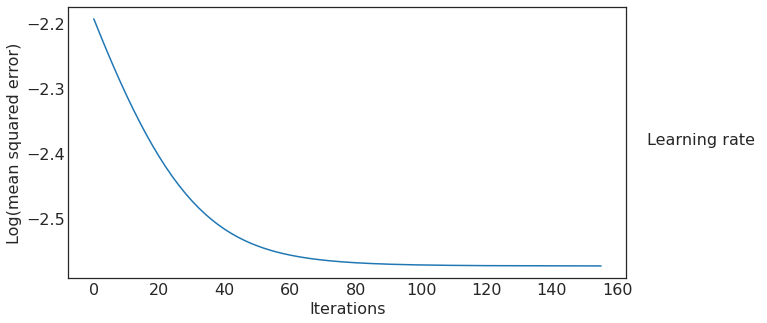

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
#for i in range(len(tot_errs)):
ax.plot(np.log10(np.array(tot_errs).flatten()))
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("Log(mean squared error)")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()

No handles with labels found to put in legend.


0.7489311


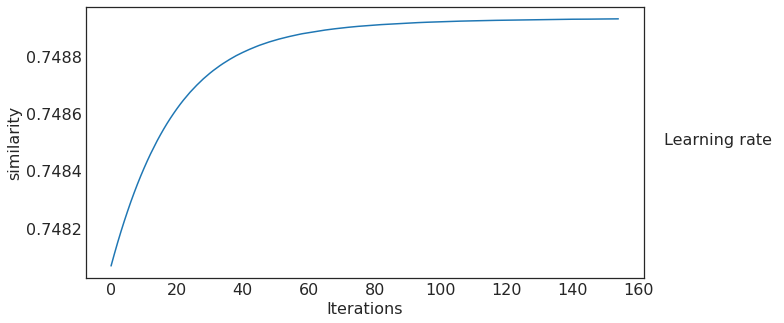

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,5))
x = np.linspace(1,tot_iters,tot_iters)
for i in range(len(tot_accs)):
  ax.plot(np.array(tot_accs).flatten())
  #ax[1].plot(x[int(0.8*tot_iters):], np.log10(tot_errs[i])[int(0.8*tot_iters):], label = '%.3f' %lrs[i])
ax.legend(title = 'Learning rate', loc='center right', bbox_to_anchor=(1.25, 0.5), prop={'size': 12})
#ax[1].set_ylim([-4.12,-4.0])
ax.set_xlabel("Iterations")
ax.set_ylabel("similarity")
#ax[1].set_xlabel("Iterations")
#ax[1].legend()
print(np.array(tot_accs).max())

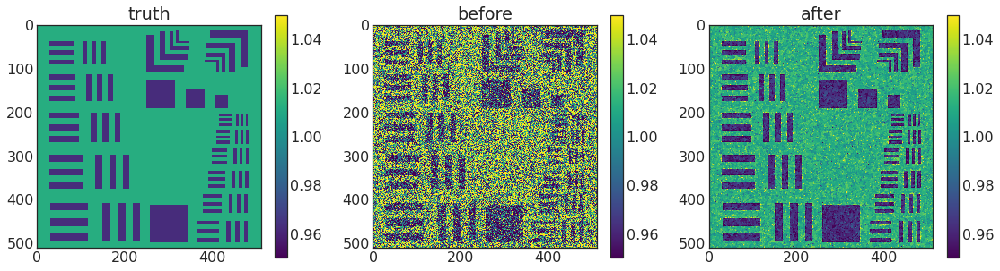

In [ ]:
tru_intense = A_sample/A_sample.mean()
plot3([tru_intense,A_samples[0],result[0][0]],["truth", "before", "after"], vmin=0.95, vmax=1.05)

In [ ]:
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)

A00 = np.load(path+"A_samples_noise_0.npy")[0]
A10 = np.load(path+"A_samples_noise_10.npy")[0]
A20 = np.load(path+"A_samples_noise_20.npy")[0]
A30 = np.load(path+"A_samples_noise_30.npy")[0]


In [ ]:
import bm3d


In [ ]:
corr = []
for i in np.arange(1,10,1):
  print(i)
  res = denoise_bilateral(A30, sigma_color=0.4, sigma_spatial=i)
  corr += [(res*tru_intense).sum() / np.sqrt((res*res).sum() * (tru_intense*tru_intense).sum())]



1
2
3
4
5
6
7
8
9


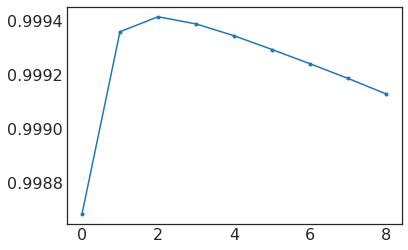

In [ ]:
plt.plot(corr, '.-')

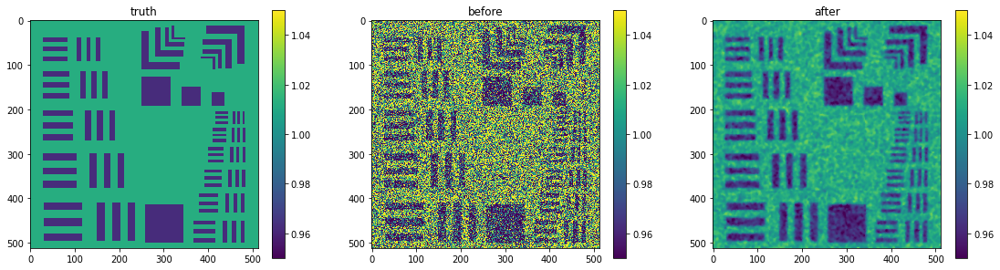

In [ ]:
A10 = np.load(path+"A_samples_noise10_defoc2.npy")[0]


(65, 512, 512) 0.2720396743019801 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
(2, 512, 512) 0.3602786033229663 [1. 1.]
(65, 512, 512) 0.3602786033229663 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


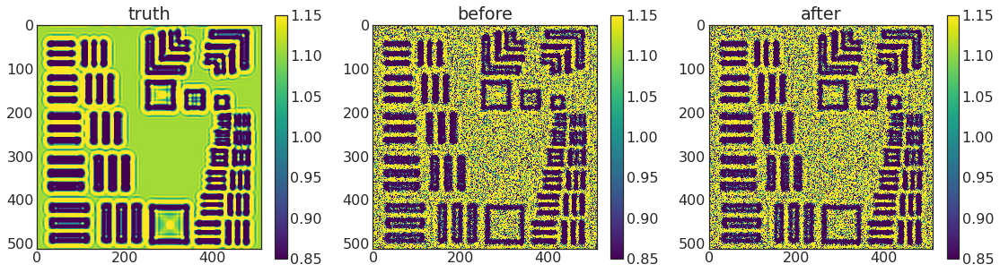

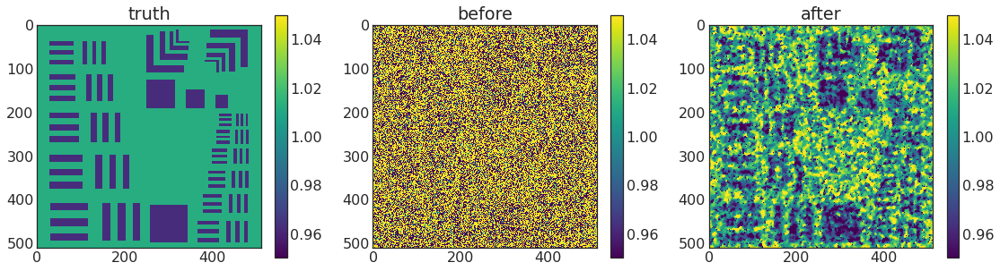

In [ ]:
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)

A_samples = np.load(path+"A_samples0.npy")
print(A_samples.shape, A_samples[-1].std(), A_samples.mean(1).mean(1))
A_noise = np.load(path+"A_noise.npy") # in intensity not amplitude, for 1% noise
ndefocus = 2
noiselvl = 40
I_samples = A_samples**2+A_noise * noiselvl * np.sqrt(ndefocus/2) # defocus
I_samples[I_samples<0]=0
B_samples = np.sqrt(I_samples)[32::int(32/ndefocus)][1:]
B_samples /= B_samples.mean(1).mean(1)[:,np.newaxis,np.newaxis]
print(B_samples.shape, B_samples[-1].std(), B_samples.mean(1).mean(1))
np.save(path+"A_samples_noise{0}_defoc{1}.npy".format(noiselvl, ndefocus), B_samples)
I_samples = A_samples**2+A_noise * noiselvl # on focus
I_samples[I_samples<0]=0
C_samples = np.sqrt(I_samples)
C_samples /= C_samples.mean(1).mean(1)[:,np.newaxis,np.newaxis]
print(C_samples.shape, C_samples[-1].std(), C_samples.mean(1).mean(1))
np.save(path+"amplitude4TIE_noise{0}.npy".format(noiselvl), C_samples)

plot3([A_samples[-1],B_samples[-1],C_samples[-1]],["truth", "before", "after"], vmin=0.85, vmax=1.15)

D_sample=denoise_tv_chambolle(C_samples[32], weight=noiselvl/100./2, multichannel=False)
np.save(path+"denoise_tv_chambolle_A{0}.npy".format(noiselvl), D_sample)

plot3([A_samples[32],C_samples[32], D_sample],["truth", "before", "after"], vmin=0.95, vmax=1.05)

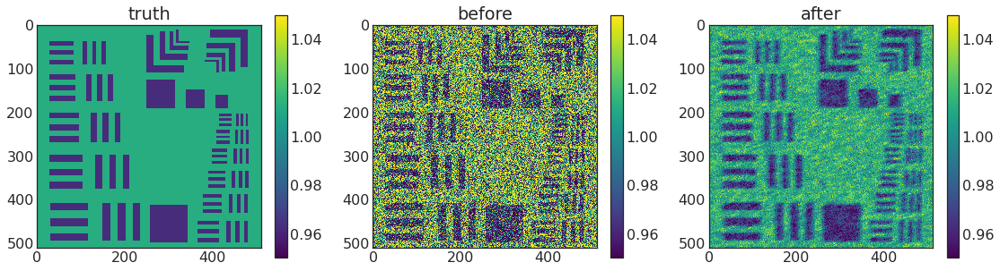

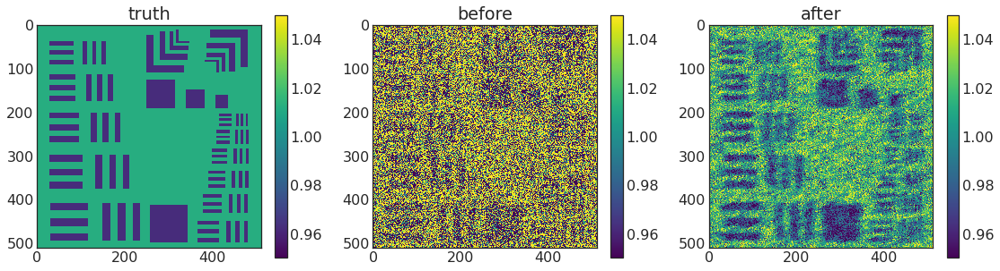

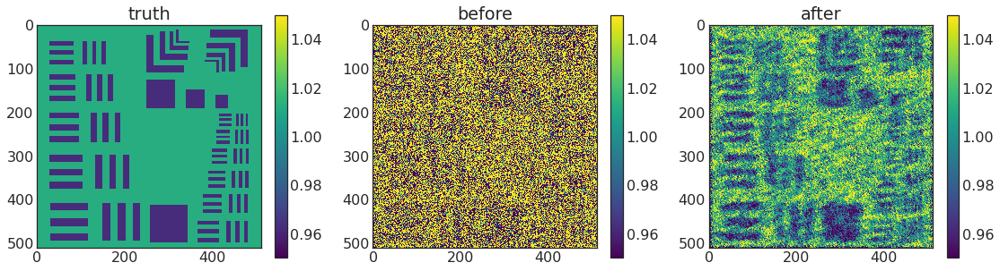

In [ ]:
#B10=denoise_tv_chambolle(A10, weight=0.05, multichannel=False)
#B10=bm3d.bm3d(A10, sigma_psd=0.05, stage_arg=bm3d.BM3DStages.ALL_STAGES)#bm3d.BM3DStages.HARD_THRESHOLDING)
B10=denoise_bilateral(A10, sigma_color=0.1, sigma_spatial=2)
plot3([tru_intense,A10,B10],["truth", "before", "after"], vmin=0.95, vmax=1.05)

#B20=denoise_tv_chambolle(A20, weight=0.1, multichannel=False)
#B20=bm3d.bm3d(A20, sigma_psd=0.1, stage_arg=bm3d.BM3DStages.ALL_STAGES)#bm3d.BM3DStages.HARD_THRESHOLDING)
B20=denoise_bilateral(A20, sigma_color=0.2, sigma_spatial=3)
plot3([tru_intense,A20,B20],["truth", "before", "after"], vmin=0.95, vmax=1.05)

#B30=denoise_tv_chambolle(A30, weight=0.15, multichannel=False)
#B30=bm3d.bm3d(A30, sigma_psd=0.15, stage_arg=bm3d.BM3DStages.ALL_STAGES)#bm3d.BM3DStages.HARD_THRESHOLDING)
B30=denoise_bilateral(A30, sigma_color=0.4, sigma_spatial=3)
plot3([tru_intense,A30,B30],["truth", "before", "after"], vmin=0.95, vmax=1.05)

#np.save(path+"denoise_bm3d_A10.npy", B10)
#np.save(path+"denoise_bm3d_A20.npy", B20)
#np.save(path+"denoise_bm3d_A30.npy", B30)

In [ ]:
acc_max = np.load(path+'acc_test_noise10.npz')['acc_max']
acc_max[acc_max==0]=np.NaN

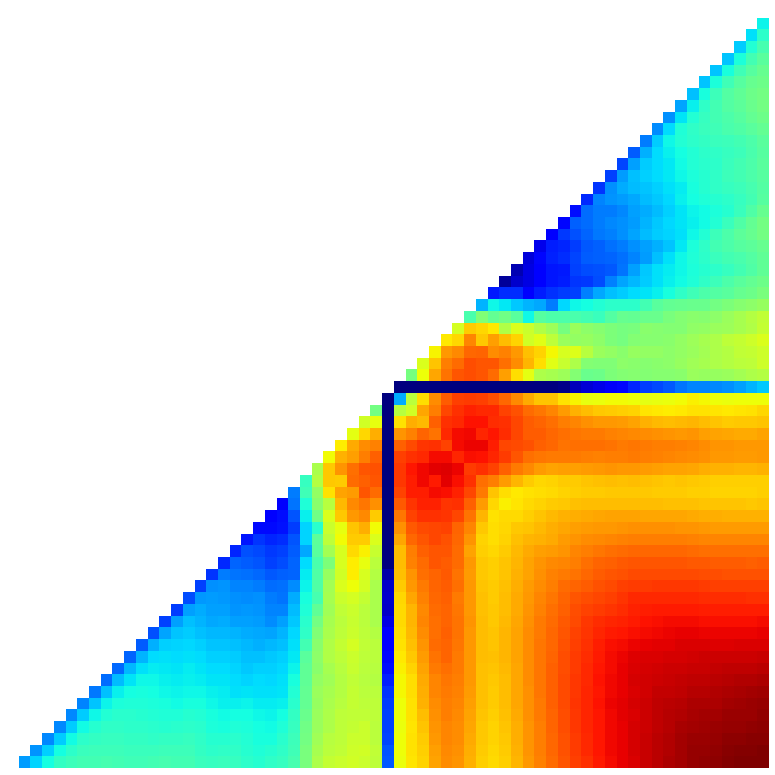

In [ ]:
from matplotlib import cm
newjet = cm.jet
newjet.set_bad('w')
newjet.set_under('#00007F')
fig, ax = plt.subplots(figsize=(14,14))

im = ax.imshow(acc_max, cmap=newjet, interpolation='none', origin='lower',vmin=0.5, vmax=0.9)
ax.set_axis_off()
#ax.set_xticks(np.arange(65));
#ax.set_yticks(np.arange(65));
#ax.tick_params(labelsize=15)
#ax.yaxis.tick_right()


#Loop over data dimensions and create text annotations.
#for i in range(65):
#    for j in range(i+1,65):
#        text = ax.text(j, i, "{0:.0f}".format(acc_max[i, j]*100),
#                       ha="center", va="center", color="w", fontsize=15)

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"acc_max_10_new.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

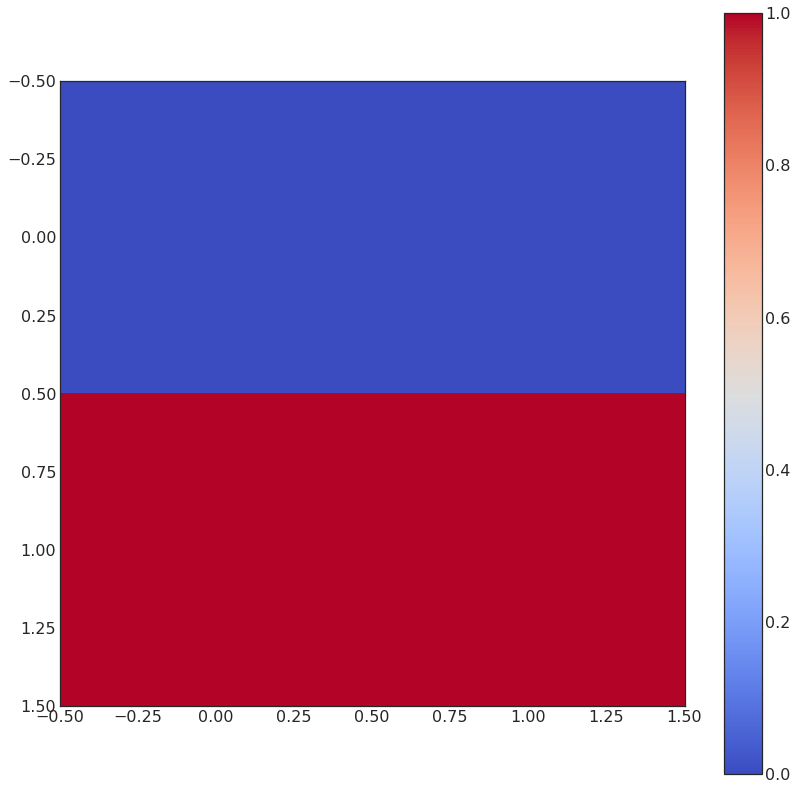

In [ ]:
a=np.ones((2,2))
a[0]=0
a[1]=1
f,ax=plt.subplots(figsize=(14,14))
plt.imshow(a, cmap='coolwarm')
plt.colorbar()

In [ ]:
acc_iter = np.load(path+'acc_test_noise10.npz')['acc_iter']
acc_iter[acc_iter==0]=np.NaN

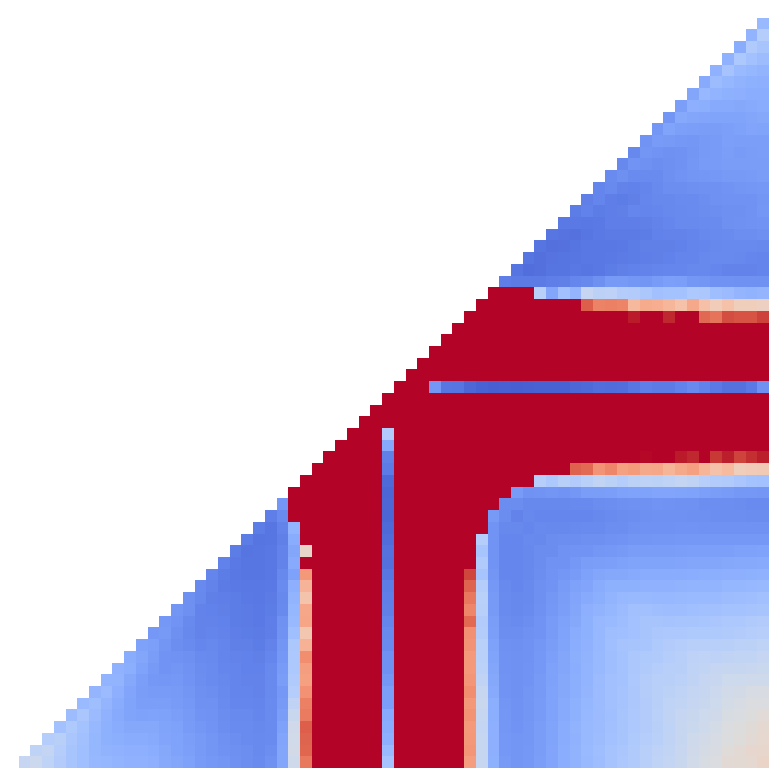

In [ ]:
from matplotlib import cm
newjet = cm.coolwarm
newjet.set_bad('w')
newjet.set_under('w')
fig, ax = plt.subplots(figsize=(14,14))

im = ax.imshow(acc_iter/499.*100, cmap=newjet, interpolation='none', origin='lower',vmin=0, vmax=100)

ax.set_axis_off()
#ax.set_xticks(np.arange(65));
#ax.set_yticks(np.arange(65));
#ax.tick_params(labelsize=15)
#ax.yaxis.tick_right()
#ax.set_yticklabels(["004_A","004_B","004_C","004_D","004_E"])
#ax.set_xticklabels(["220_A","220_B","220_C","220_D","220_E"])

#Loop over data dimensions and create text annotations.
#for i in range(65):
#    for j in range(i+1,65):
#        text = ax.text(j, i, "{0:.0f}".format(acc_iter[i, j]/499.*100),
#                       ha="center", va="center", color="w", fontsize=15)

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"acc_iter_10_new.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

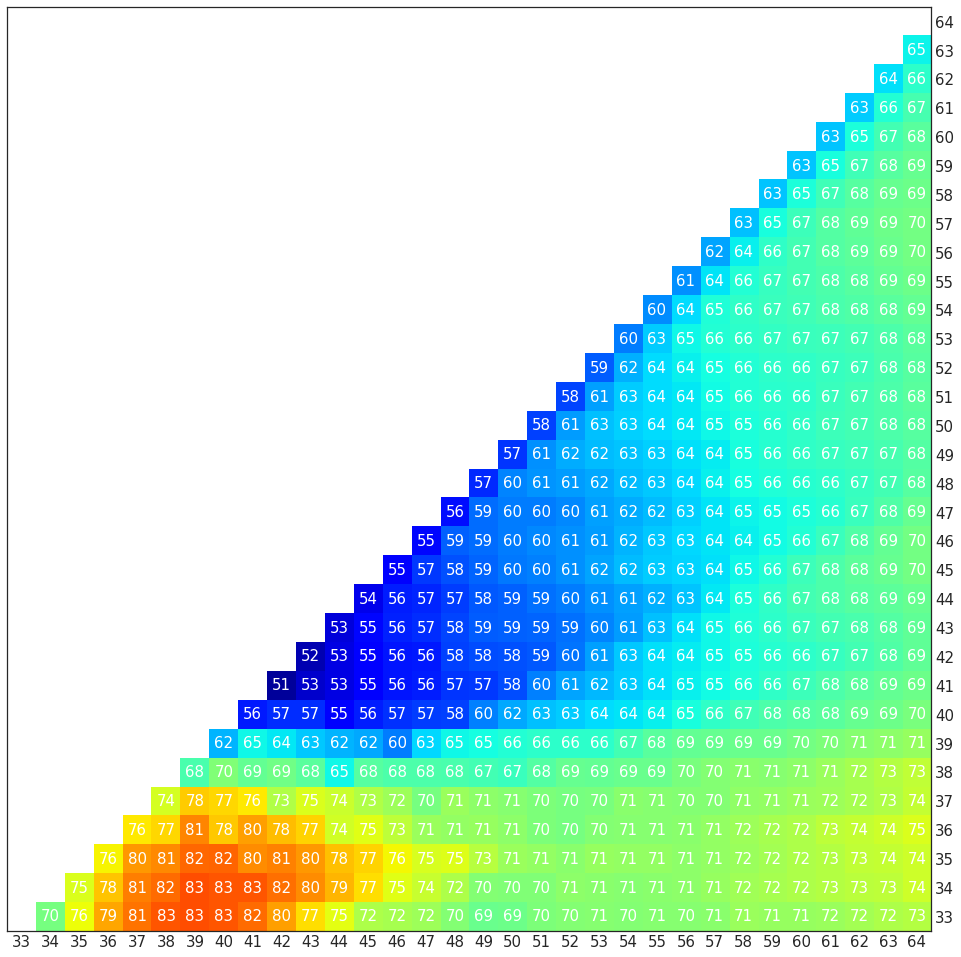

In [ ]:
fig, ax = plt.subplots(figsize=(17,17))

im = ax.imshow(acc_max[33:,33:], cmap=newjet, interpolation='none', origin='lower',vmin=0.5, vmax=0.9)

ax.set_xticks(np.arange(32));
ax.set_yticks(np.arange(32));
ax.set_yticklabels(np.arange(33,65))
ax.set_xticklabels(np.arange(33,65))
ax.tick_params(labelsize=15)
ax.yaxis.tick_right()
#ax.set_yticklabels(["004_A","004_B","004_C","004_D","004_E"])
#ax.set_xticklabels(["220_A","220_B","220_C","220_D","220_E"])

#Loop over data dimensions and create text annotations.
for i in range(33,65):
    for j in range(i+1,65):
        text = ax.text(j-33, i-33, "{0:.0f}".format(acc_max[i, j]*100),
                       ha="center", va="center", color="w", fontsize=15)

#plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"acc_max_10_quart.png", dpi=300, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, format=None,
#        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

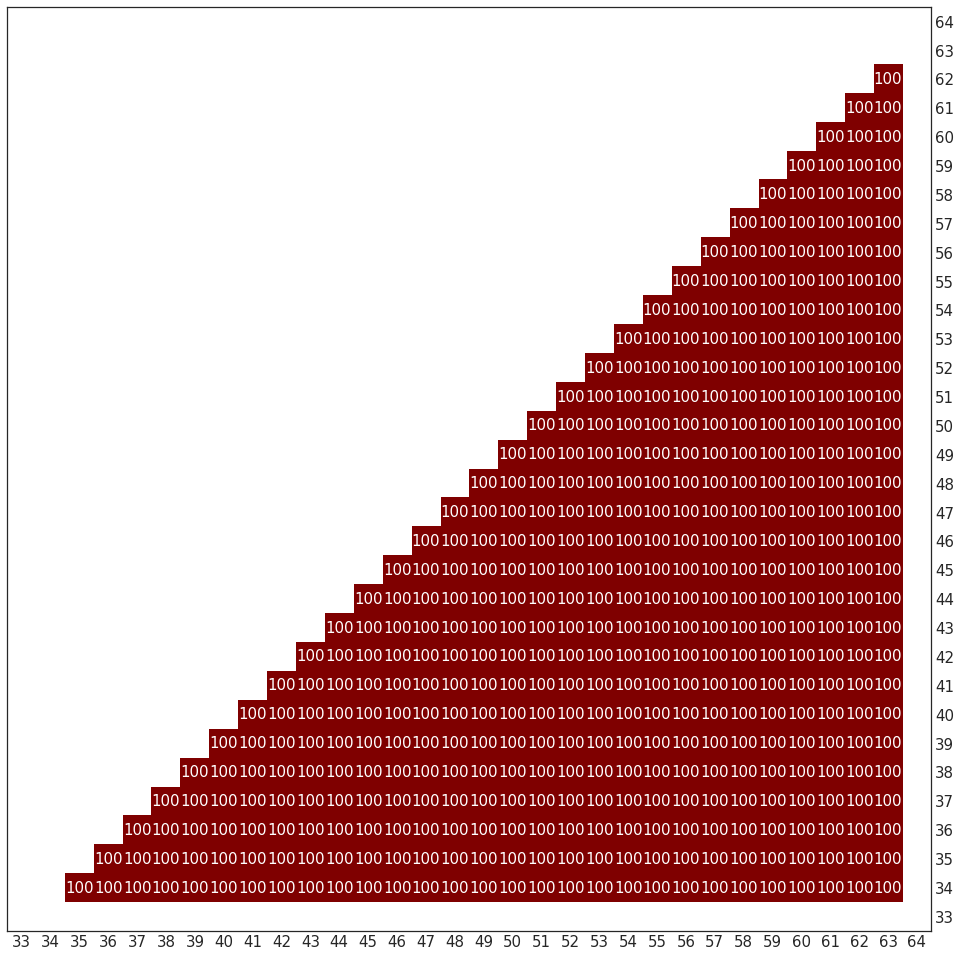

In [ ]:
from matplotlib import cm
fig, ax = plt.subplots(figsize=(17,17))

im = ax.imshow(acc_iter[33:,33:]/499.*100, cmap=newjet, interpolation='none', origin='lower',vmin=0.5, vmax=0.9)

ax.set_xticks(np.arange(32));
ax.set_yticks(np.arange(32));
ax.set_yticklabels(np.arange(33,65))
ax.set_xticklabels(np.arange(33,65))
ax.tick_params(labelsize=15)
ax.yaxis.tick_right()

#Loop over data dimensions and create text annotations.
for i in range(33,65):
    for j in range(i+1,65):
        text = ax.text(j-33, i-33, "{0:.0f}".format(acc_iter[i, j]/499.*100),
                       ha="center", va="center", color="w", fontsize=15)

plt.savefig("/content/drive/My Drive/new_test_data_for_ADLorentz/new_paper/"+"acc_iter_10_quart.png", dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format=None,
        transparent=False, bbox_inches="tight", pad_inches=0.1, metadata=None)

In [ ]:
A_sample =  tif.imread(path+'restest_design_amp.tiff')
Ph_true = tif.imread(path+'restest_design_tphi_nobckgrd.tiff')

truth = A_sample*np.exp(1j*Ph_true)
Ph_true_mean = Ph_true-Ph_true.mean()

acc_final = np.zeros((65,65))
acc_max = np.zeros((65,65))
acc_iter = np.zeros((65,65))

for i in range(34,64):
  t1=time.time()
  print(i)
  for j in range(i+1,64):
    tf_microscope = np.load(path+"tf_microscope.npy")[[33,i,j,64]]
    A_samples = np.load(path+"amplitude4TIE_noise15.npy")[[33,i,j,64]]
    exp_img = tf.constant(A_samples, dtype=tf.float32)
    intens = tf.constant(A_sample, dtype='float32')
    phase = tf.Variable(np.zeros(A_sample.shape)+0.5, dtype='float32')
    tot_errs = []
    tot_accs = []
    tot_iters = 500
    init_lr = lr
    result=optiz(1e-7,tot_iters,1)
    acc_final[i,j] = np.array(result[2])[-1]
    acc_max[i,j] = np.array(result[2]).max()
    acc_iter[i,j] = np.array(result[2]).argmax()
  print(time.time()-t1)
output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')



34
275.7526617050171
35
266.2729573249817
36
257.7241940498352
37
247.0461311340332
38
237.56968426704407
39
227.81881046295166
40
219.56343531608582
41
209.91556763648987
42
198.7450385093689
43
193.44842076301575
44
184.05531120300293
45
171.5123212337494
46
161.56659317016602
47
152.1328582763672
48
142.80024552345276
49
132.91766357421875
50
124.00458645820618
51
113.94700336456299
52
104.45618343353271
53
95.49708819389343
54
86.03587293624878
55
75.63425540924072
56
66.81757116317749
57
56.8724365234375
58
48.19574499130249
59
38.16725301742554
60
28.64313244819641
61
19.13817286491394
62
9.585784196853638
63
0.0003437995910644531


In [ ]:
A_sample1 =  np.load(path+"A_samples0.npy")
A_sample2 = np.load(path+"amplitude4TIE_noise5.npy")

0.02564901959071873


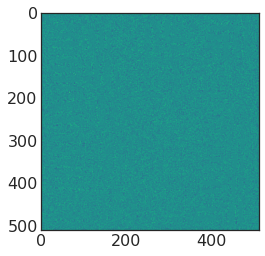

In [ ]:
print((A_sample2-A_sample1).std())
plt.imshow((A_sample2[1]-A_sample1[1]))

In [ ]:
np.savez(path+'acc_test_noise10_quart.npz', acc_max=acc_max, acc_final=acc_final, acc_iter=acc_iter)